In [ ]:
import warnings
warnings.filterwarnings('ignore')
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.model_selection import StratifiedKFold, train_test_split
import tensorflow as tf
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Load dataset

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Social media affect/global_student_digital_behavior_dataset.csv')

In [ ]:
df

,student_id,country,development_level,poverty_rate_percent,internet_infrastructure_index,average_internet_speed_mbps,age,gender,urban_rural,family_income_level,...,ads_viewed_per_day,ads_clicked_per_week,impulse_purchase_score,digital_spending_per_month,cyberbullying_exposure,adult_content_exposure,digital_addiction_score,wellbeing_index,academic_risk_score,financial_risk_score
0,1,Qatar,Developing,16.30,54.93,27.19,21,Male,Rural,High,...,38.699484,3.119569,3.681066,79.508194,No,No,8.179932,66.662166,0.0,26.516722
1,2,USA,Developed,8.75,94.39,85.34,25,Male,Urban,Middle,...,157.400429,18.358090,6.538867,73.452464,No,Yes,22.073122,43.892278,0.0,39.257741
2,3,Mexico,Developing,23.64,47.24,73.55,18,Female,Urban,Low,...,79.603536,11.758299,5.150660,35.753069,No,No,12.591830,65.484625,0.0,47.542155
3,4,Canada,Developed,14.51,90.50,188.19,25,Male,Urban,Middle,...,69.318324,7.906197,3.195383,47.607487,No,Yes,8.008238,57.909392,0.0,23.436122
4,5,Sri Lanka,Underdeveloped,62.28,36.84,11.02,15,Other,Rural,Middle,...,144.019899,19.427839,7.180234,82.941313,No,No,21.551334,53.686356,0.0,47.308493
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
499995,499996,Canada,Developed,14.51,90.50,188.19,21,Male,Urban,Middle,...,166.460866,23.379044,8.590066,101.366745,No,No,26.526286,52.821510,0.0,66.506297
499996,499997,Netherlands,Developed,14.70,80.43,107.41,19,Male,Rural,Middle,...,96.675945,10.490273,5.606963,62.652082,No,No,17.949781,57.492296,0.0,42.454694
499997,499998,Singapore,Developed,7.12,82.14,217.38,17,Female,Urban,Middle,...,93.894869,14.778464,4.810537,46.508124,No,No,14.187339,55.451251,0.0,31.986106
499998,499999,Pakistan,Underdeveloped,44.14,41.89,15.38,18,Female,Rural,Middle,...,79.794652,9.814159,3.970928,58.994250,No,No,12.898963,56.261586,0.0,33.073887


In [ ]:
df.head()

,student_id,country,development_level,poverty_rate_percent,internet_infrastructure_index,average_internet_speed_mbps,age,gender,urban_rural,family_income_level,...,ads_viewed_per_day,ads_clicked_per_week,impulse_purchase_score,digital_spending_per_month,cyberbullying_exposure,adult_content_exposure,digital_addiction_score,wellbeing_index,academic_risk_score,financial_risk_score
0,1,Qatar,Developing,16.30,54.93,27.19,21,Male,Rural,High,...,38.699484,3.119569,3.681066,79.508194,No,No,8.179932,66.662166,0.0,26.516722
1,2,USA,Developed,8.75,94.39,85.34,25,Male,Urban,Middle,...,157.400429,18.358090,6.538867,73.452464,No,Yes,22.073122,43.892278,0.0,39.257741
2,3,Mexico,Developing,23.64,47.24,73.55,18,Female,Urban,Low,...,79.603536,11.758299,5.150660,35.753069,No,No,12.591830,65.484625,0.0,47.542155
3,4,Canada,Developed,14.51,90.50,188.19,25,Male,Urban,Middle,...,69.318324,7.906197,3.195383,47.607487,No,Yes,8.008238,57.909392,0.0,23.436122
4,5,Sri Lanka,Underdeveloped,62.28,36.84,11.02,15,Other,Rural,Middle,...,144.019899,19.427839,7.180234,82.941313,No,No,21.551334,53.686356,0.0,47.308493


In [ ]:
df.shape

(500000, 48)

In [ ]:
df.dtypes

,0
student_id,int64
country,object
development_level,object
poverty_rate_percent,float64
internet_infrastructure_index,float64
average_internet_speed_mbps,float64
age,int64
gender,object
urban_rural,object
family_income_level,object


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500000 entries, 0 to 499999
Data columns (total 48 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   student_id                      500000 non-null  int64  
 1   country                         500000 non-null  object 
 2   development_level               500000 non-null  object 
 3   poverty_rate_percent            500000 non-null  float64
 4   internet_infrastructure_index   500000 non-null  float64
 5   average_internet_speed_mbps     500000 non-null  float64
 6   age                             500000 non-null  int64  
 7   gender                          500000 non-null  object 
 8   urban_rural                     500000 non-null  object 
 9   family_income_level             500000 non-null  object 
 10  device_access                   500000 non-null  object 
 11  internet_access_hours           500000 non-null  float64
 12  education_level 

In [ ]:
# check the columns of dataset
df.columns

Index(['student_id', 'country', 'development_level', 'poverty_rate_percent',
       'internet_infrastructure_index', 'average_internet_speed_mbps', 'age',
       'gender', 'urban_rural', 'family_income_level', 'device_access',
       'internet_access_hours', 'education_level', 'field_of_study',
       'academic_motivation', 'online_learning_hours', 'social_media_hours',
       'sessions_per_day', 'average_session_length_minutes',
       'late_night_usage', 'education_content_hours', 'short_video_hours',
       'entertainment_content_hours', 'news_content_hours',
       'likes_given_per_day', 'comments_written_per_day',
       'posts_created_per_week', 'late_night_score', 'brain_rot_index',
       'brain_rot_level', 'attention_span_minutes', 'study_hours_per_week',
       'class_attendance_rate', 'productivity_score', 'sleep_hours',
       'stress_level', 'anxiety_score', 'depression_score',
       'ads_viewed_per_day', 'ads_clicked_per_week', 'impulse_purchase_score',
       'digital_s

In [ ]:
df.drop('student_id', axis=1, inplace=True)

In [ ]:
# check the columns of dataset
df.columns

Index(['country', 'development_level', 'poverty_rate_percent',
       'internet_infrastructure_index', 'average_internet_speed_mbps', 'age',
       'gender', 'urban_rural', 'family_income_level', 'device_access',
       'internet_access_hours', 'education_level', 'field_of_study',
       'academic_motivation', 'online_learning_hours', 'social_media_hours',
       'sessions_per_day', 'average_session_length_minutes',
       'late_night_usage', 'education_content_hours', 'short_video_hours',
       'entertainment_content_hours', 'news_content_hours',
       'likes_given_per_day', 'comments_written_per_day',
       'posts_created_per_week', 'late_night_score', 'brain_rot_index',
       'brain_rot_level', 'attention_span_minutes', 'study_hours_per_week',
       'class_attendance_rate', 'productivity_score', 'sleep_hours',
       'stress_level', 'anxiety_score', 'depression_score',
       'ads_viewed_per_day', 'ads_clicked_per_week', 'impulse_purchase_score',
       'digital_spending_per_mo

Preprocessing - null value check

In [ ]:
# Check null values
print(df.isnull().sum())

country                                0
development_level                      0
poverty_rate_percent                   0
internet_infrastructure_index          0
average_internet_speed_mbps            0
age                                    0
gender                                 0
urban_rural                            0
family_income_level                    0
device_access                          0
internet_access_hours                  0
education_level                        0
field_of_study                    247349
academic_motivation                    0
online_learning_hours                  0
social_media_hours                     0
sessions_per_day                       0
average_session_length_minutes         0
late_night_usage                       0
education_content_hours                0
short_video_hours                      0
entertainment_content_hours            0
news_content_hours                     0
likes_given_per_day                    0
comments_written

In [ ]:
# Remove rows containing null values
df = df.dropna()

In [ ]:
# Verify again
print(df.isnull().sum())

country                           0
development_level                 0
poverty_rate_percent              0
internet_infrastructure_index     0
average_internet_speed_mbps       0
age                               0
gender                            0
urban_rural                       0
family_income_level               0
device_access                     0
internet_access_hours             0
education_level                   0
field_of_study                    0
academic_motivation               0
online_learning_hours             0
social_media_hours                0
sessions_per_day                  0
average_session_length_minutes    0
late_night_usage                  0
education_content_hours           0
short_video_hours                 0
entertainment_content_hours       0
news_content_hours                0
likes_given_per_day               0
comments_written_per_day          0
posts_created_per_week            0
late_night_score                  0
brain_rot_index             

In [ ]:
# checking the duplicated values in datasets
print(df.duplicated().sum())

0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 249204 entries, 0 to 499999
Data columns (total 47 columns):
 #   Column                          Non-Null Count   Dtype  
---  ------                          --------------   -----  
 0   country                         249204 non-null  object 
 1   development_level               249204 non-null  object 
 2   poverty_rate_percent            249204 non-null  float64
 3   internet_infrastructure_index   249204 non-null  float64
 4   average_internet_speed_mbps     249204 non-null  float64
 5   age                             249204 non-null  int64  
 6   gender                          249204 non-null  object 
 7   urban_rural                     249204 non-null  object 
 8   family_income_level             249204 non-null  object 
 9   device_access                   249204 non-null  object 
 10  internet_access_hours           249204 non-null  float64
 11  education_level                 249204 non-null  object 
 12  field_of_study       

In [ ]:
# statistical summary of dataset
df.describe()

,poverty_rate_percent,internet_infrastructure_index,average_internet_speed_mbps,age,internet_access_hours,academic_motivation,online_learning_hours,social_media_hours,sessions_per_day,average_session_length_minutes,...,anxiety_score,depression_score,ads_viewed_per_day,ads_clicked_per_week,impulse_purchase_score,digital_spending_per_month,digital_addiction_score,wellbeing_index,academic_risk_score,financial_risk_score
count,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,...,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000,249204.000000
mean,25.094822,61.645496,76.469968,22.005875,5.098725,6.110909,6.928334,3.281817,9.706817,37.830937,...,4.812885,5.011763,95.049437,12.409852,5.422301,60.194462,13.811019,57.632426,0.056426,40.990712
std,14.946914,20.576064,66.313400,2.155503,1.564995,1.505265,1.700114,1.238415,3.250552,12.994519,...,1.749500,2.038342,32.035130,4.329502,1.541040,28.959926,5.695623,10.362749,0.545790,13.372863
min,5.210000,20.760000,5.740000,17.000000,0.500000,1.000000,0.000000,0.000000,1.000000,3.000000,...,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,13.755421,0.000000,0.000000
25%,13.320000,45.170000,24.250000,20.000000,4.014595,5.113657,5.790326,2.410812,7.437301,28.744263,...,3.597105,3.565046,72.608754,9.425267,4.360712,38.561466,9.790331,50.630663,0.000000,31.663759
50%,21.080000,63.700000,52.360000,22.000000,5.101404,6.154514,6.946922,3.208946,9.540490,37.171340,...,4.785332,4.975031,93.359257,12.252390,5.382852,55.653830,13.315090,57.827514,0.000000,40.323539
75%,34.310000,80.430000,118.900000,24.000000,6.186953,7.152054,8.084179,4.078921,11.812632,46.217967,...,5.997395,6.403139,115.779522,15.235800,6.450151,77.085465,17.531452,64.852722,0.000000,49.641354
max,62.280000,94.390000,238.050000,25.000000,11.273316,10.000000,13.530034,9.000000,26.032059,90.000000,...,10.000000,10.000000,256.626877,33.933309,10.000000,193.621956,40.222905,99.385461,20.533951,100.000000


EDA analysis

In [ ]:
categorical_cols = df.select_dtypes(include=['object']).columns
numerical_cols = df.select_dtypes(include=['int64','float64']).columns

print("Categorical Columns:", categorical_cols)
print("Numerical Columns:", numerical_cols)

Categorical Columns: Index(['country', 'development_level', 'gender', 'urban_rural',
       'family_income_level', 'device_access', 'education_level',
       'field_of_study', 'late_night_usage', 'brain_rot_level',
       'cyberbullying_exposure', 'adult_content_exposure'],
      dtype='object')
Numerical Columns: Index(['poverty_rate_percent', 'internet_infrastructure_index',
       'average_internet_speed_mbps', 'age', 'internet_access_hours',
       'academic_motivation', 'online_learning_hours', 'social_media_hours',
       'sessions_per_day', 'average_session_length_minutes',
       'education_content_hours', 'short_video_hours',
       'entertainment_content_hours', 'news_content_hours',
       'likes_given_per_day', 'comments_written_per_day',
       'posts_created_per_week', 'late_night_score', 'brain_rot_index',
       'attention_span_minutes', 'study_hours_per_week',
       'class_attendance_rate', 'productivity_score', 'sleep_hours',
       'stress_level', 'anxiety_score', '

In [ ]:
# checking the how many types of soil
df['country'].unique()

array(['Qatar', 'USA', 'Canada', 'Saudi Arabia', 'Japan', 'Germany',
       'South Africa', 'France', 'UK', 'Turkey', 'Vietnam', 'South Korea',
       'Nigeria', 'Kenya', 'Denmark', 'Chile', 'Philippines', 'UAE',
       'Tanzania', 'Oman', 'Peru', 'Morocco', 'Netherlands', 'Sweden',
       'Australia', 'Bangladesh', 'Poland', 'China', 'Ethiopia',
       'Singapore', 'Argentina', 'Kuwait', 'Romania', 'Pakistan',
       'Indonesia', 'Malaysia', 'Laos', 'Bolivia', 'India', 'Nepal',
       'Switzerland', 'Cambodia', 'Thailand', 'New Zealand', 'Sri Lanka',
       'Ghana', 'Mexico', 'Kazakhstan', 'Norway', 'Brazil'], dtype=object)

In [ ]:
# checking the how many values of the each soil type
df['country'].value_counts()

,count
country,
Denmark,5491
France,5467
New Zealand,5459
Canada,5457
Sweden,5423
Australia,5389
USA,5384
Switzerland,5383
Japan,5382


In [ ]:
# checking the types of crop
df['gender'].unique()

array(['Male', 'Female', 'Other'], dtype=object)

In [ ]:
# know checking the values of each crop types
df['country'].value_counts()

,count
country,
Denmark,5491
France,5467
New Zealand,5459
Canada,5457
Sweden,5423
Australia,5389
USA,5384
Switzerland,5383
Japan,5382


In [ ]:
df.shape

(249204, 47)

In [ ]:
categorical_cols = df.select_dtypes(include=['object']).columns
numerical_cols = df.select_dtypes(include=['int64','float64']).columns

print("Categorical Columns:", categorical_cols)
print("Numerical Columns:", numerical_cols)

Categorical Columns: Index(['country', 'development_level', 'gender', 'urban_rural',
       'family_income_level', 'device_access', 'education_level',
       'field_of_study', 'late_night_usage', 'brain_rot_level',
       'cyberbullying_exposure', 'adult_content_exposure'],
      dtype='object')
Numerical Columns: Index(['poverty_rate_percent', 'internet_infrastructure_index',
       'average_internet_speed_mbps', 'age', 'internet_access_hours',
       'academic_motivation', 'online_learning_hours', 'social_media_hours',
       'sessions_per_day', 'average_session_length_minutes',
       'education_content_hours', 'short_video_hours',
       'entertainment_content_hours', 'news_content_hours',
       'likes_given_per_day', 'comments_written_per_day',
       'posts_created_per_week', 'late_night_score', 'brain_rot_index',
       'attention_span_minutes', 'study_hours_per_week',
       'class_attendance_rate', 'productivity_score', 'sleep_hours',
       'stress_level', 'anxiety_score', '

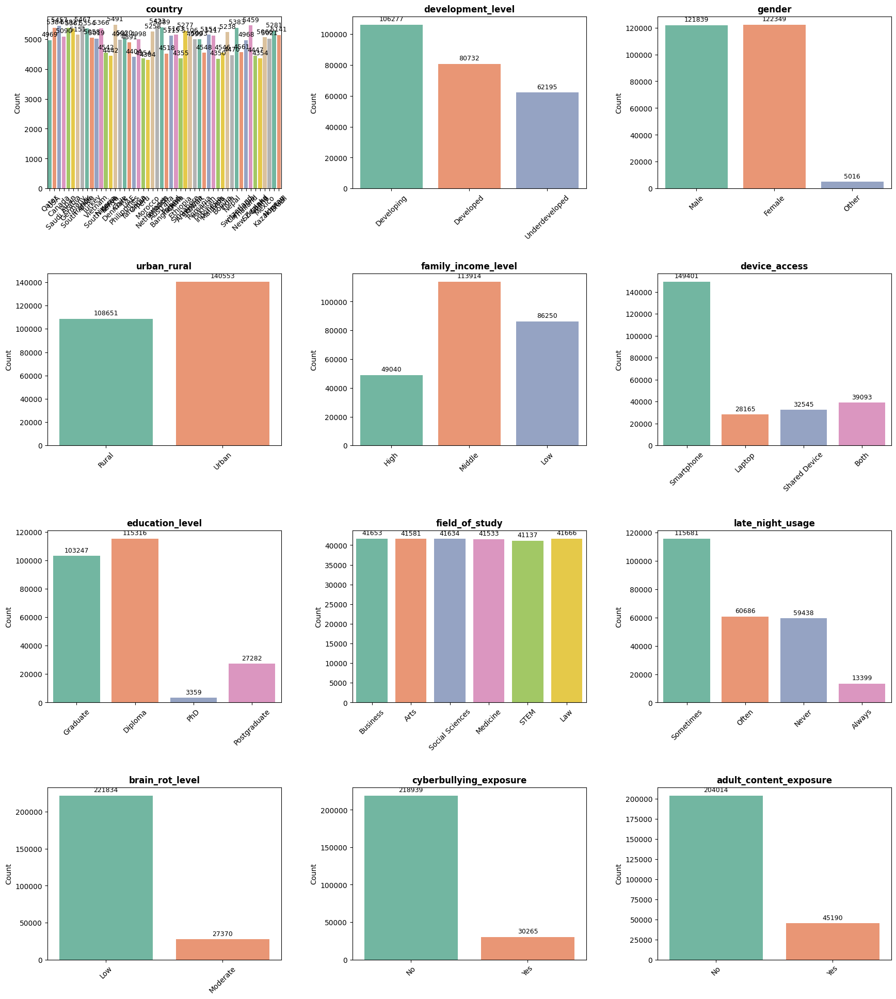

In [ ]:
import math

# Number of columns
num_cols = len(categorical_cols)

# Dynamic rows and columns
cols = 3
rows = math.ceil(num_cols / cols)

# Figure size auto-adjust
plt.figure(figsize=(18, rows * 5))

palette = sns.color_palette("Set2")

for i, col in enumerate(categorical_cols):

    plt.subplot(rows, cols, i + 1)

    ax = sns.countplot(
        x=col,
        data=df,
        hue=col,          # fixes future seaborn warning
        palette=palette,
        legend=False
    )

    # Add count labels
    for p in ax.patches:

        height = p.get_height()

        ax.annotate(
            f'{int(height)}',
            (p.get_x() + p.get_width() / 2., height),
            ha='center',
            va='bottom',
            fontsize=9,
            xytext=(0, 3),
            textcoords='offset points'
        )

    plt.title(col, fontsize=12, fontweight='bold')

    plt.xticks(rotation=45)

    plt.ylabel("Count")
    plt.xlabel("")

# Prevent overlap
plt.tight_layout(pad=3.0)

plt.show()

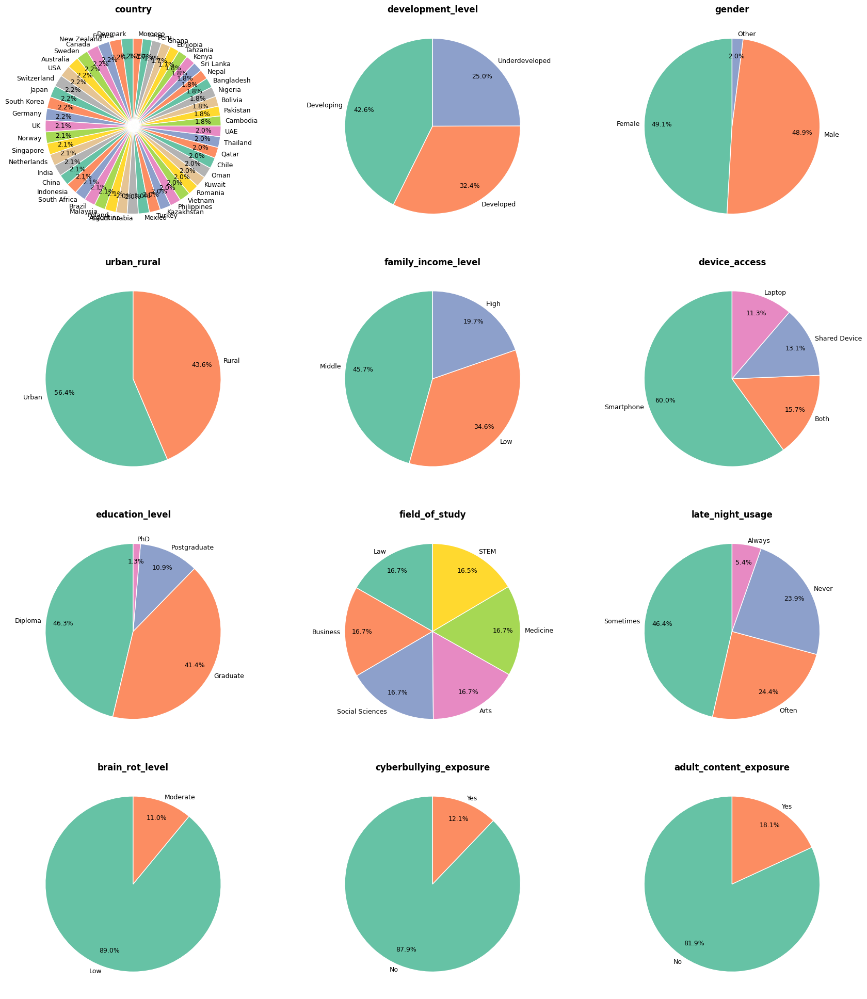

In [ ]:
import math

# Soft scientific palette
PIE_COLORS = sns.color_palette("Set2")

# Total categorical columns
num_cols = len(categorical_cols)

# Dynamic subplot size
cols = 3
rows = math.ceil(num_cols / cols)

# Bigger figure to avoid overlap
plt.figure(figsize=(18, rows * 5))

for i, col in enumerate(categorical_cols):

    plt.subplot(rows, cols, i + 1)

    count = df[col].value_counts()

    plt.pie(
        count.values,
        colors=PIE_COLORS[:len(count)],
        labels=count.index,
        autopct='%1.1f%%',
        startangle=90,

        # Better design
        pctdistance=0.8,
        labeldistance=1.05,

        wedgeprops={
            'edgecolor': 'white',
            'linewidth': 1
        },

        textprops={
            'fontsize': 9
        }
    )

    plt.title(
        col,
        fontsize=12,
        fontweight='bold'
    )

# Prevent overlap
plt.tight_layout(pad=3.0)

plt.show()

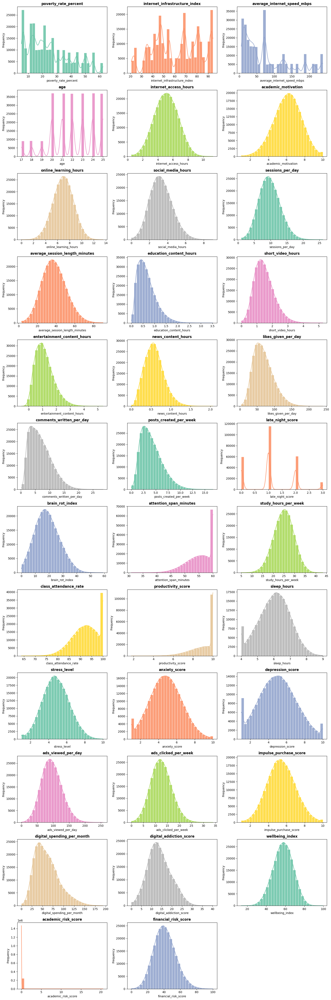

In [ ]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = len(numerical_cols)
cols = 3
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(16, rows * 4))

palette = sns.color_palette("Set2")

for i, col in enumerate(numerical_cols):
    plt.subplot(rows, cols, i + 1)

    sns.histplot(
        data=df,
        x=col,
        bins=30,
        kde=True,
        color=palette[i % len(palette)],
        edgecolor="white",
        alpha=0.85
    )

    plt.title(col, fontsize=12, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

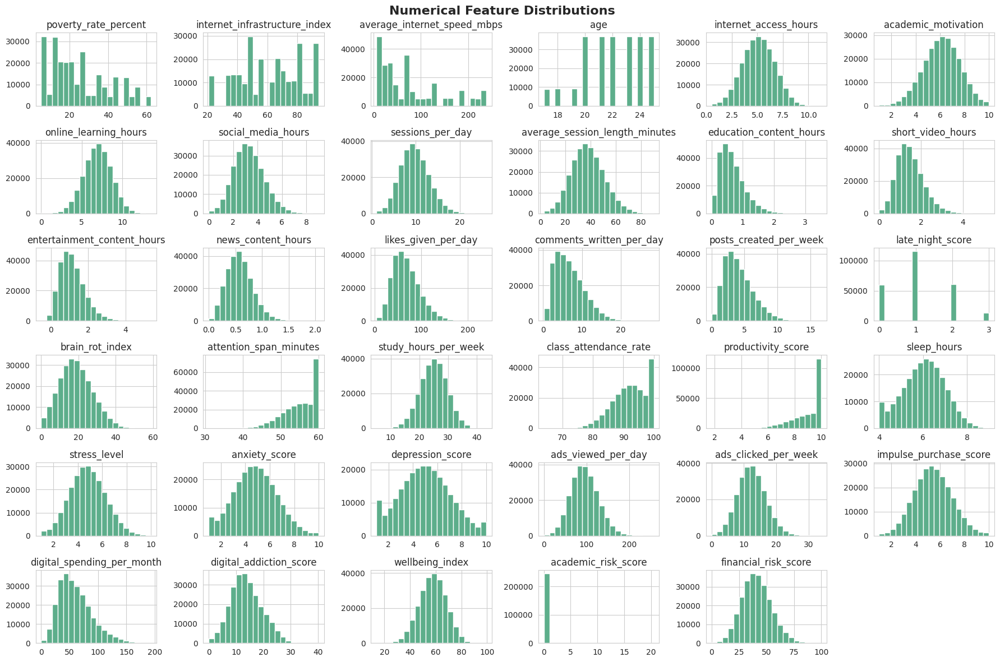

In [ ]:
sns.set_style("whitegrid")

df[numerical_cols].hist(
    bins=20,
    figsize=(18,12),
    color="#5DAE8B",
    edgecolor="white"
)

plt.suptitle("Numerical Feature Distributions", fontsize=16, fontweight='bold')
plt.tight_layout()
plt.show()


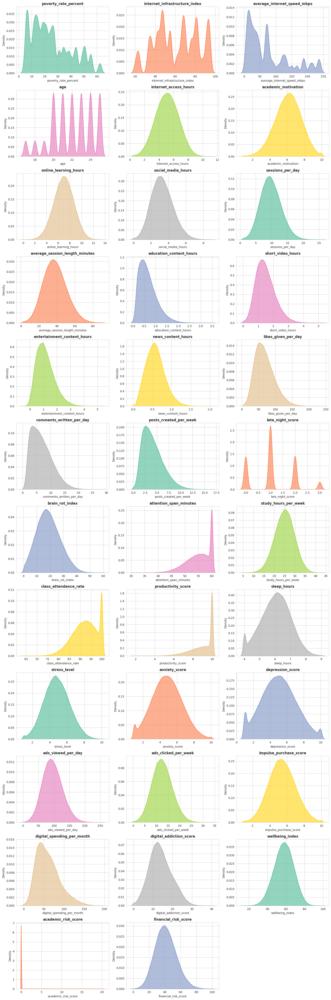

In [ ]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = len(numerical_cols)
cols = 3
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(16, rows * 4))

palette = sns.color_palette("Set2")

for i, col in enumerate(numerical_cols):
    plt.subplot(rows, cols, i + 1)

    sns.kdeplot(
        data=df,
        x=col,
        fill=True,
        color=palette[i % len(palette)],
        alpha=0.7,
        linewidth=2
    )
    plt.title(col, fontsize=12, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel("Density")

plt.tight_layout()
plt.show()

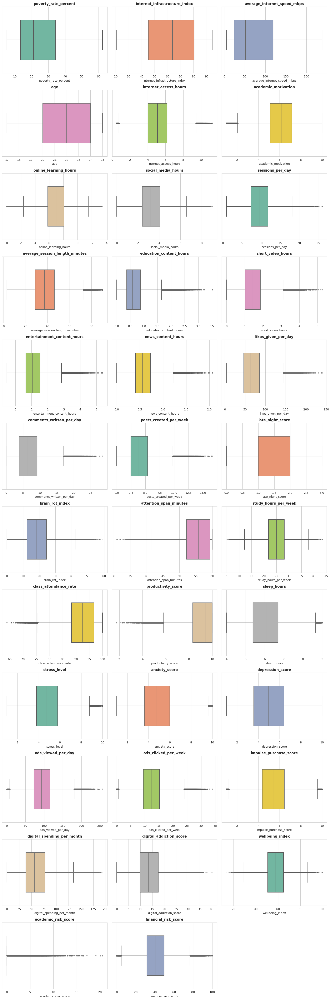

In [ ]:
import math
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = len(numerical_cols)
cols = 3
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(16, rows * 4))

palette = sns.color_palette("Set2")

for i, col in enumerate(numerical_cols):
    plt.subplot(rows, cols, i + 1)

    sns.boxplot(
        x=df[col],
        color=palette[i % len(palette)],
        width=0.6,
        fliersize=3,
        linewidth=1.5
    )

    plt.title(col, fontsize=12, fontweight='bold')
    plt.xlabel(col)

plt.tight_layout()
plt.show()

In [ ]:
categorical_cols = df.select_dtypes(include=['object']).columns
numerical_cols = df.select_dtypes(include=['int64','float64']).columns

print("Categorical Columns:", categorical_cols)
print("Numerical Columns:", numerical_cols)

Categorical Columns: Index(['country', 'development_level', 'gender', 'urban_rural',
       'family_income_level', 'device_access', 'education_level',
       'field_of_study', 'late_night_usage', 'brain_rot_level',
       'cyberbullying_exposure', 'adult_content_exposure'],
      dtype='object')
Numerical Columns: Index(['poverty_rate_percent', 'internet_infrastructure_index',
       'average_internet_speed_mbps', 'age', 'internet_access_hours',
       'academic_motivation', 'online_learning_hours', 'social_media_hours',
       'sessions_per_day', 'average_session_length_minutes',
       'education_content_hours', 'short_video_hours',
       'entertainment_content_hours', 'news_content_hours',
       'likes_given_per_day', 'comments_written_per_day',
       'posts_created_per_week', 'late_night_score', 'brain_rot_index',
       'attention_span_minutes', 'study_hours_per_week',
       'class_attendance_rate', 'productivity_score', 'sleep_hours',
       'stress_level', 'anxiety_score', '

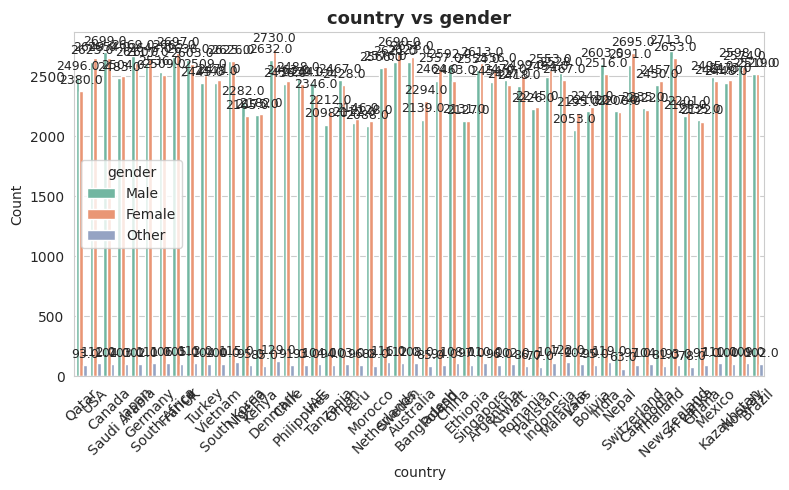

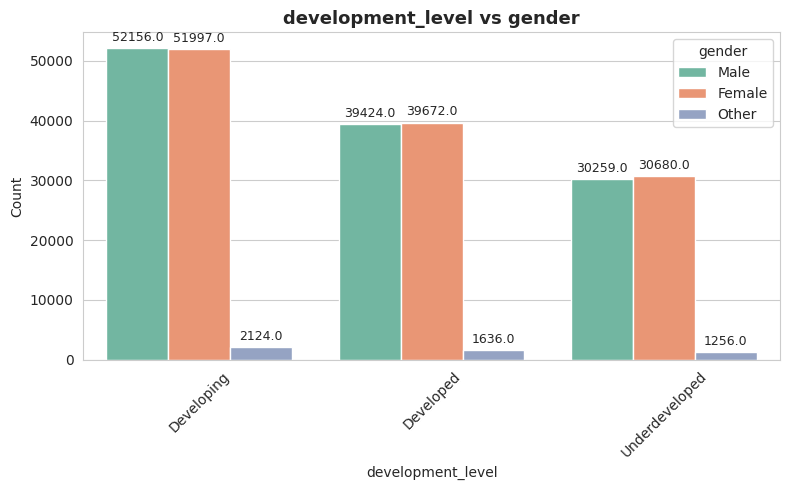

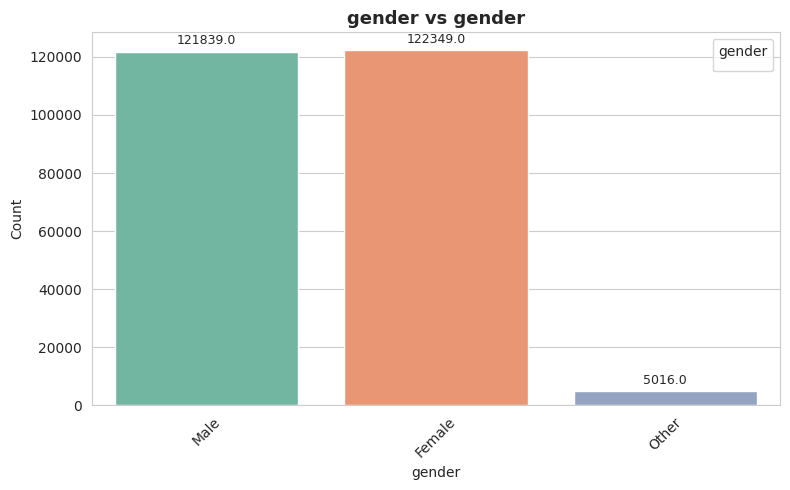

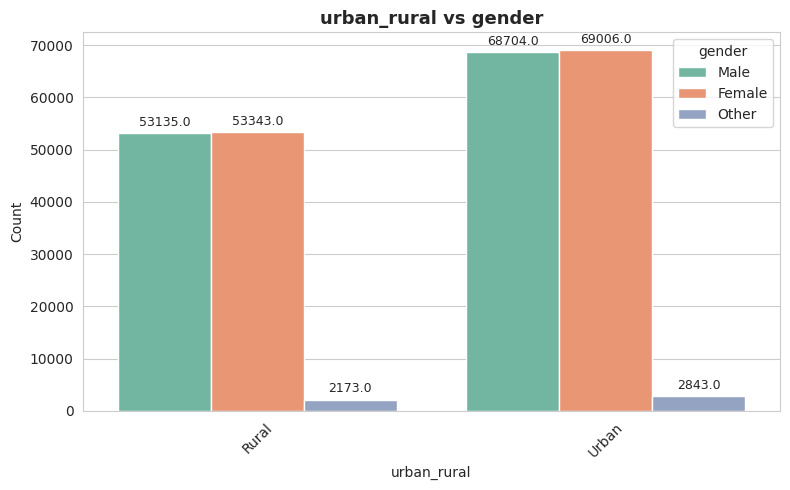

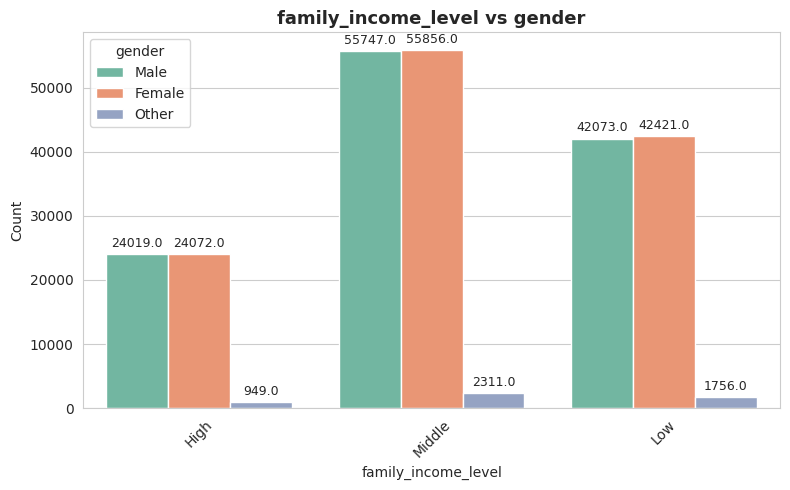

...

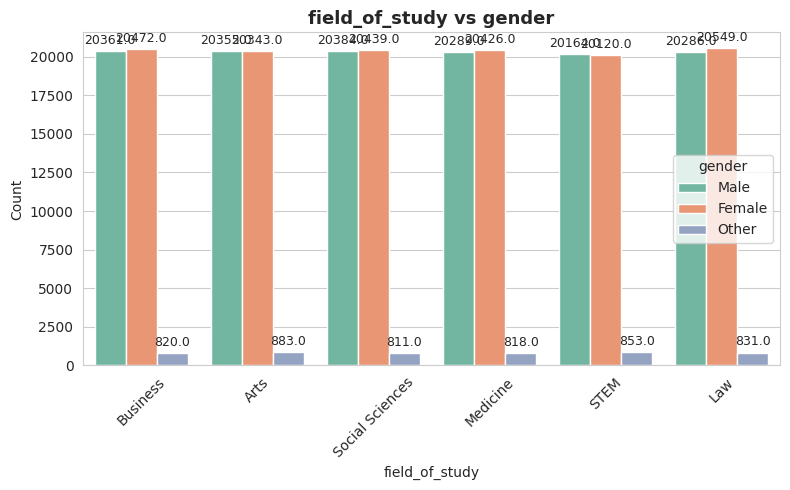

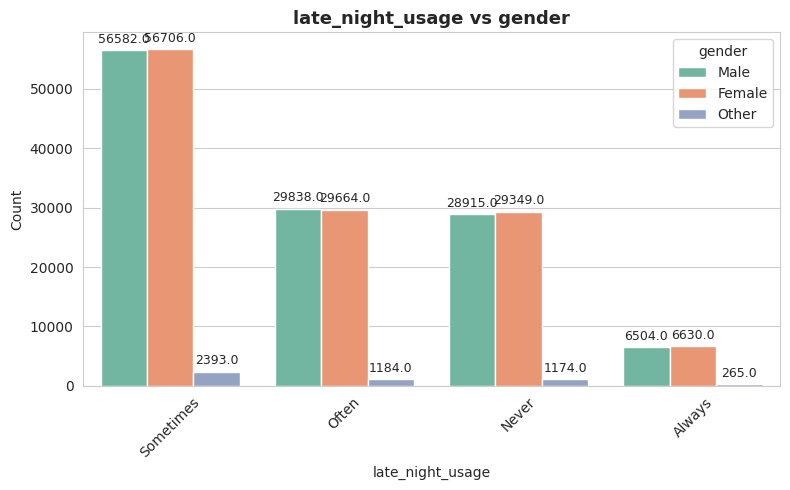

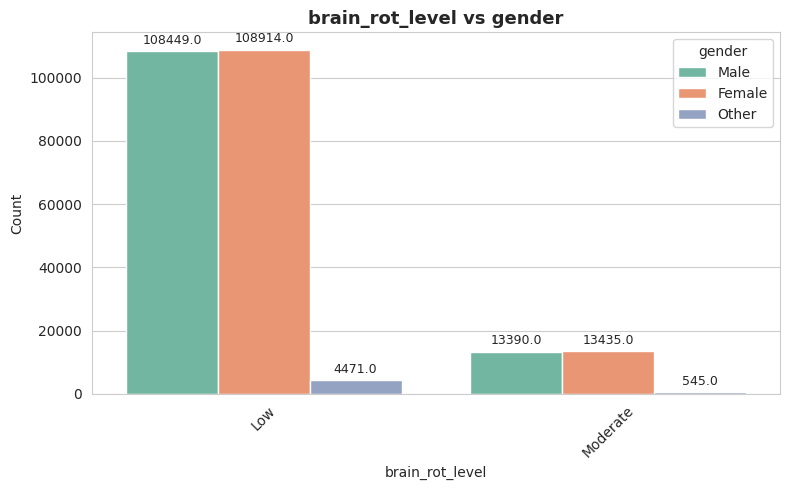

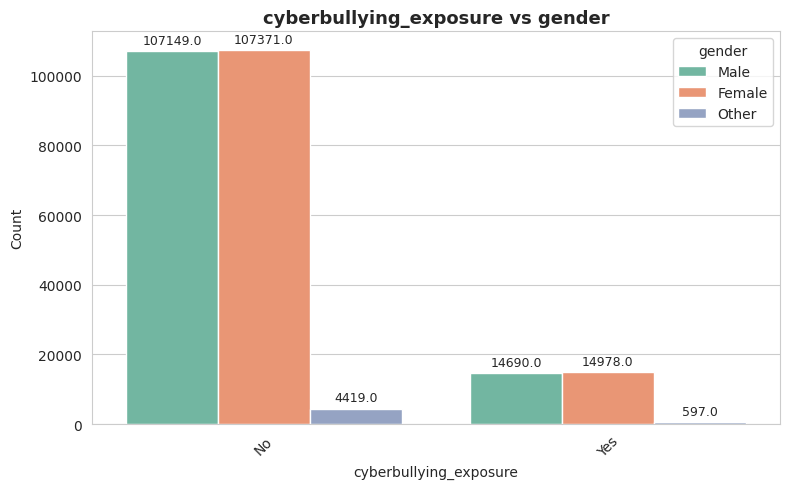

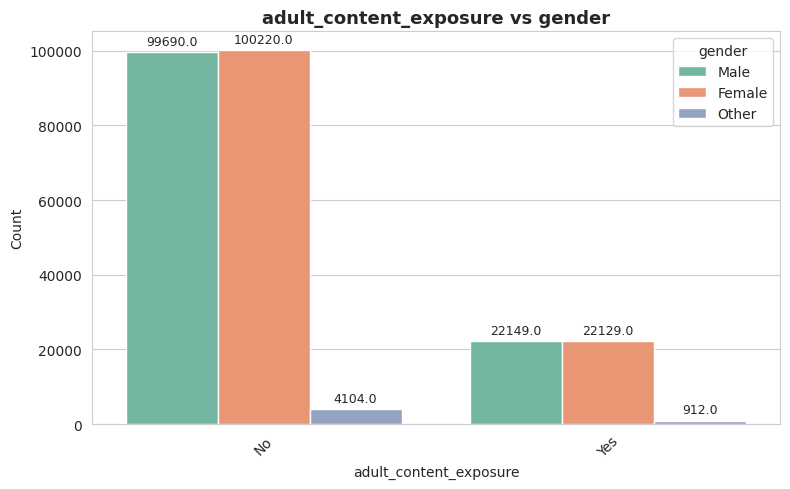

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

for col in categorical_cols:
    plt.figure(figsize=(8,5))

    ax = sns.countplot(
        x=col,
        hue='gender',
        data=df,
        palette="Set2"
    )

    # Add count labels on top
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height}',  # <-- just the count
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=9,
                xytext=(0,3),
                textcoords='offset points'
            )

    plt.xticks(rotation=45)
    plt.title(f"{col} vs gender", fontsize=13, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.legend(title="gender")

    plt.tight_layout()
    plt.show()


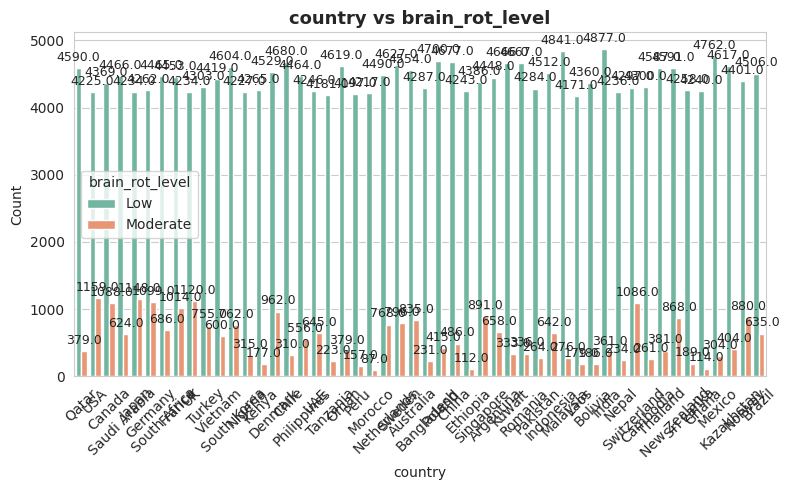

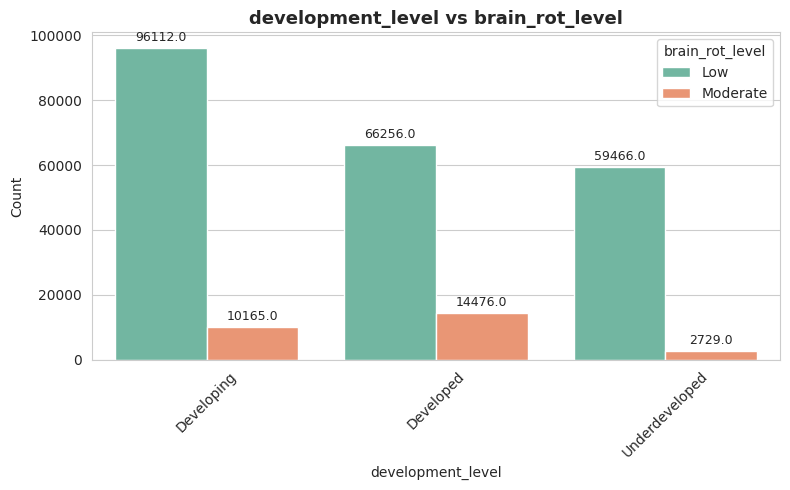

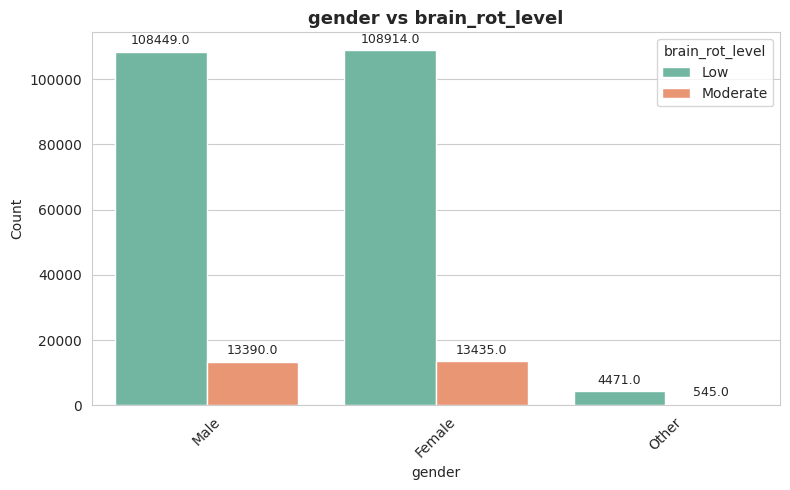

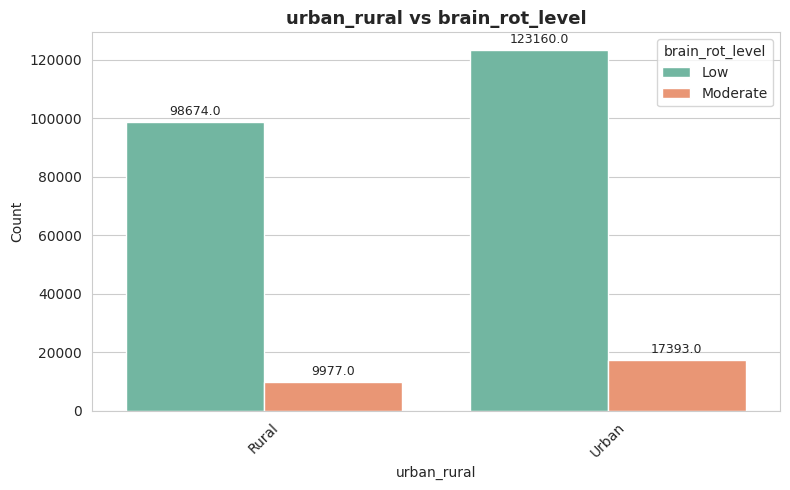

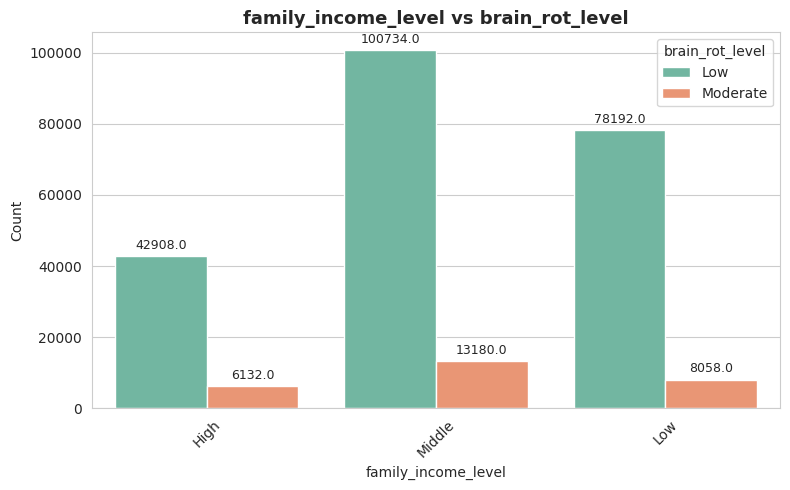

...

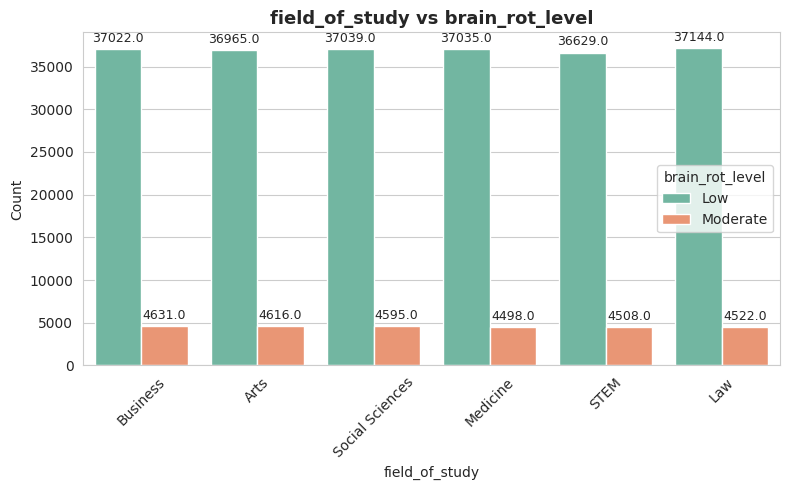

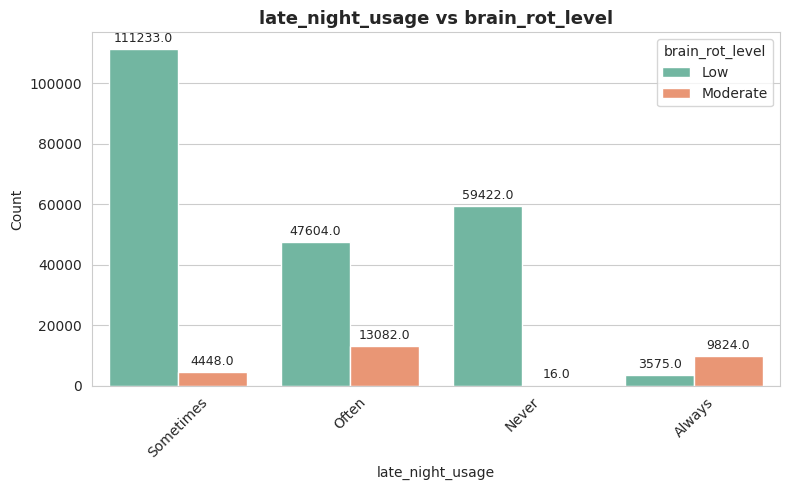

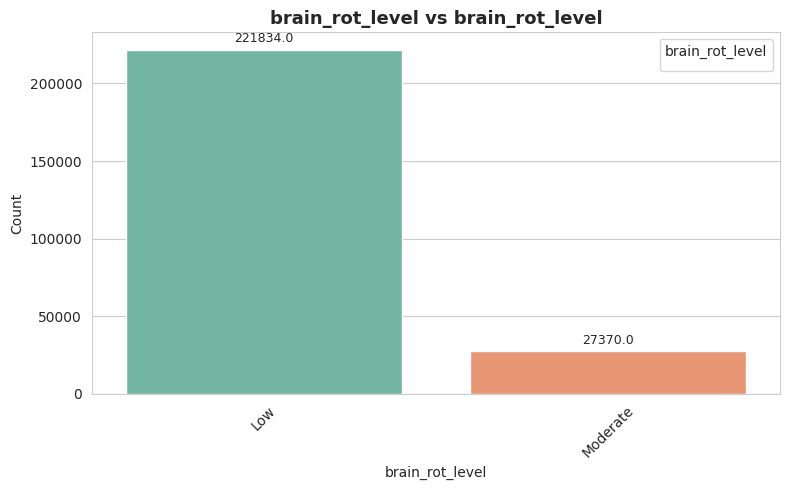

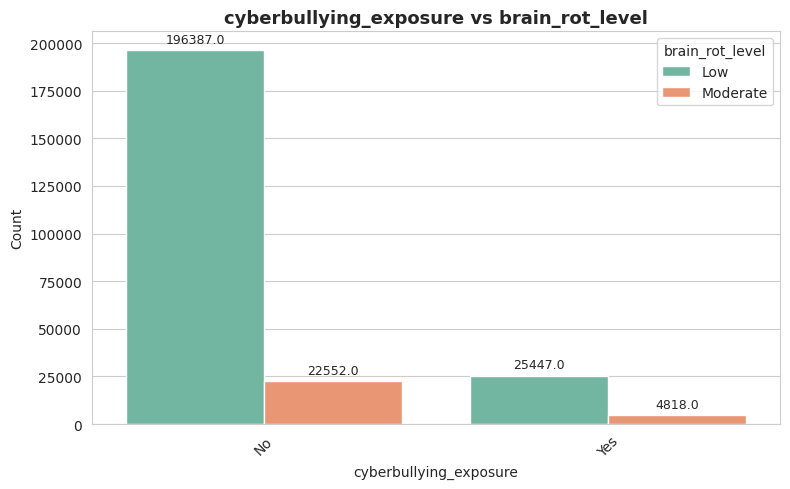

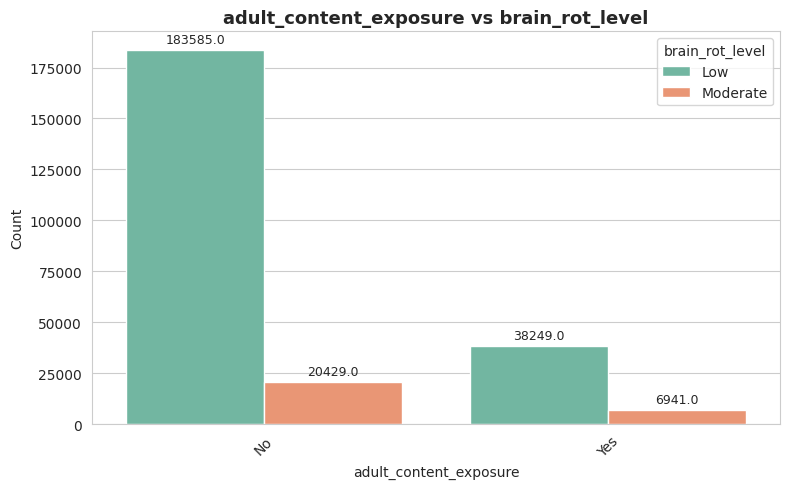

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

for col in categorical_cols:
    plt.figure(figsize=(8,5))

    ax = sns.countplot(
        x=col,
        hue='brain_rot_level',
        data=df,
        palette="Set2"
    )

    # Add count labels on top
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height}',  # <-- just the count
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=9,
                xytext=(0,3),
                textcoords='offset points'
            )

    plt.xticks(rotation=45)
    plt.title(f"{col} vs brain_rot_level", fontsize=13, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.legend(title="brain_rot_level")

    plt.tight_layout()
    plt.show()


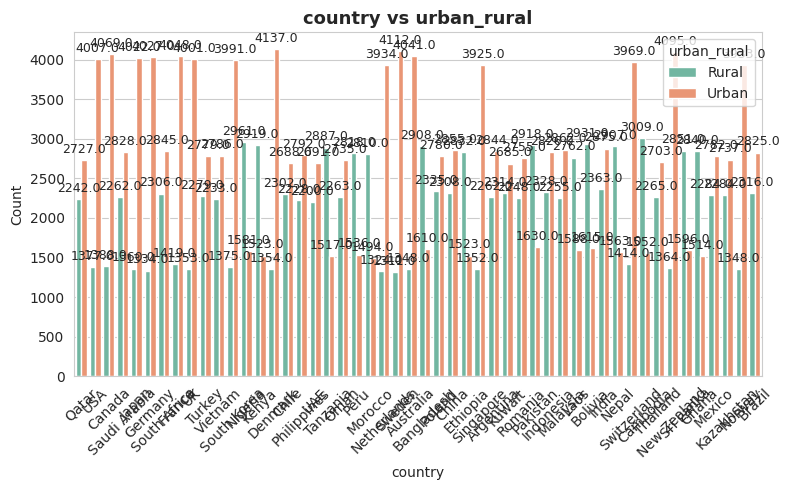

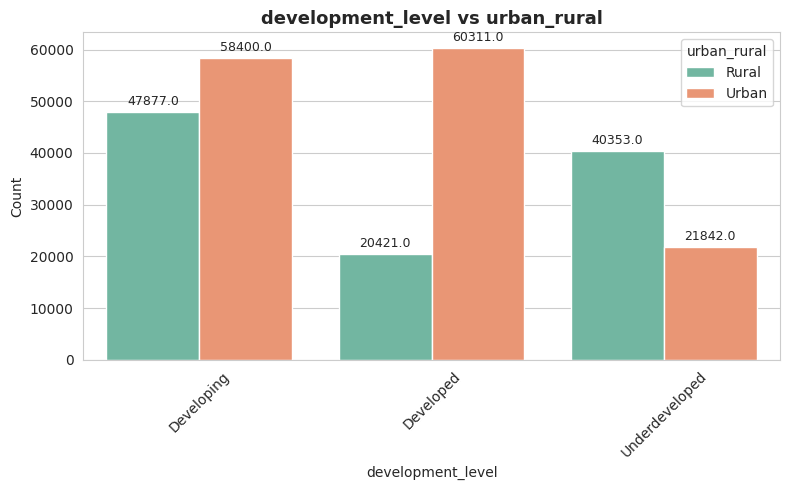

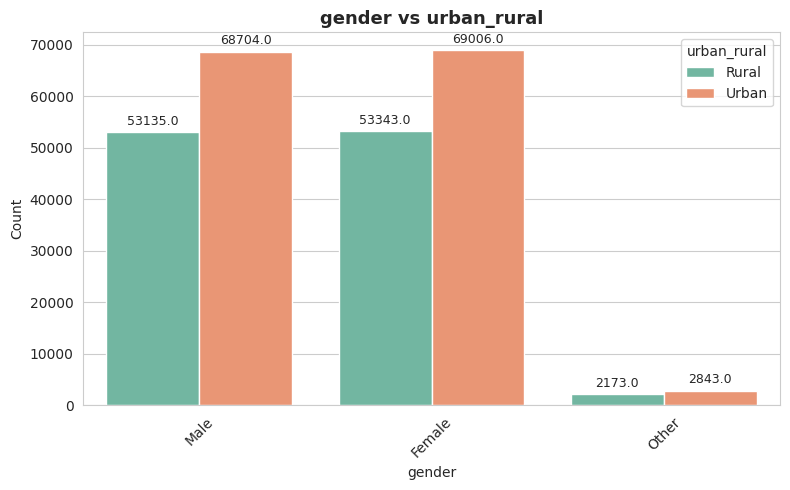

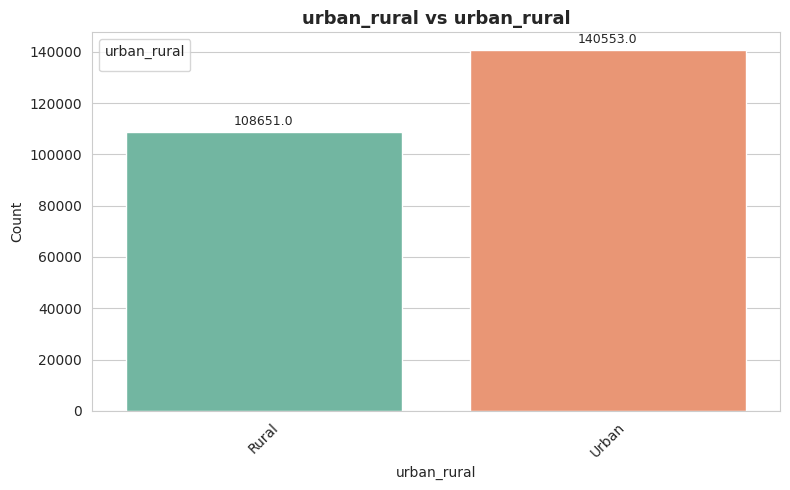

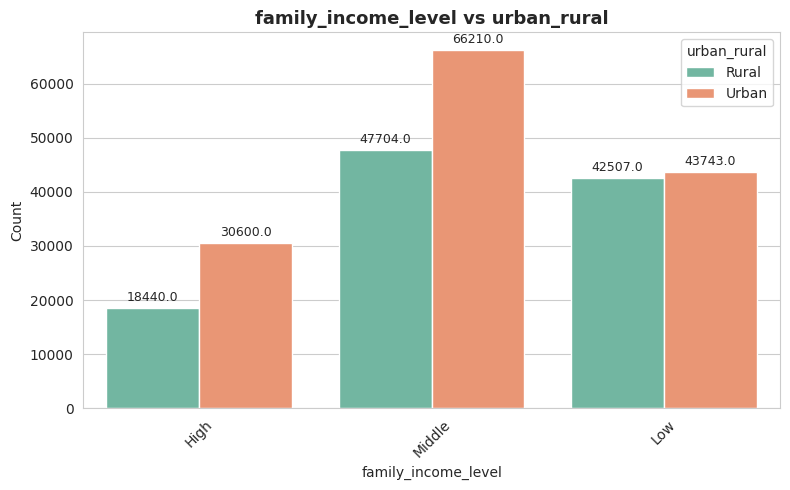

...

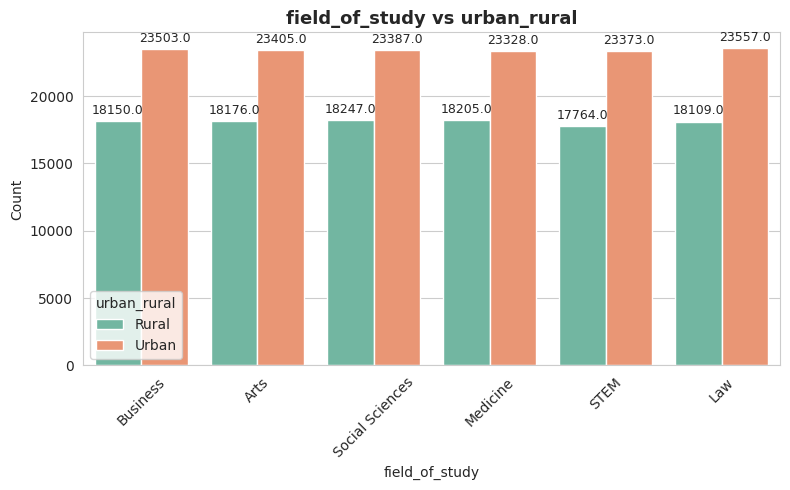

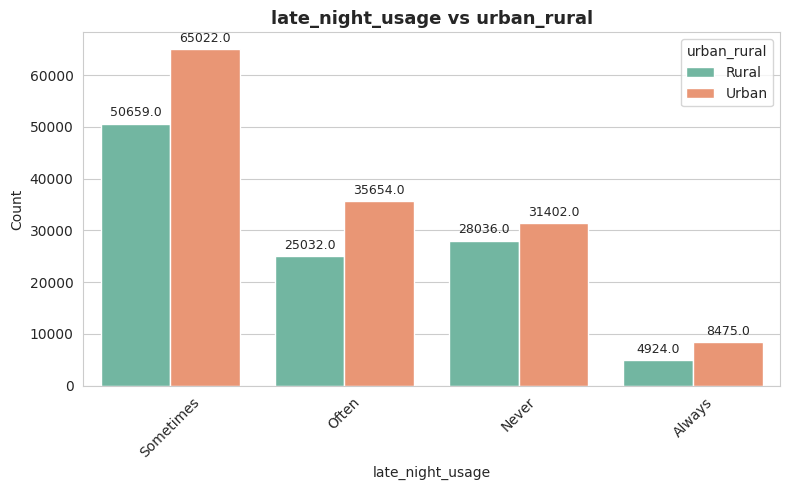

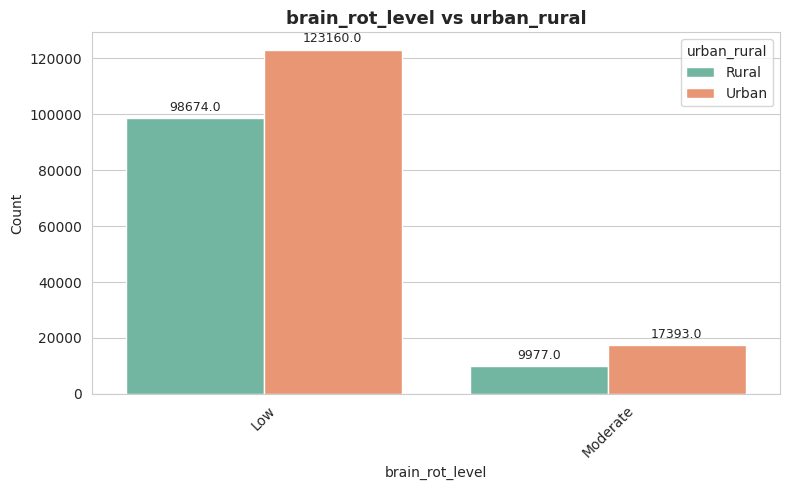

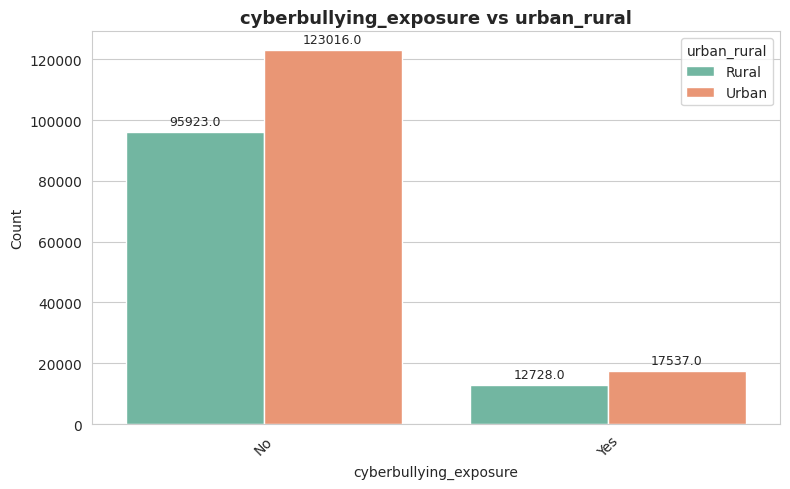

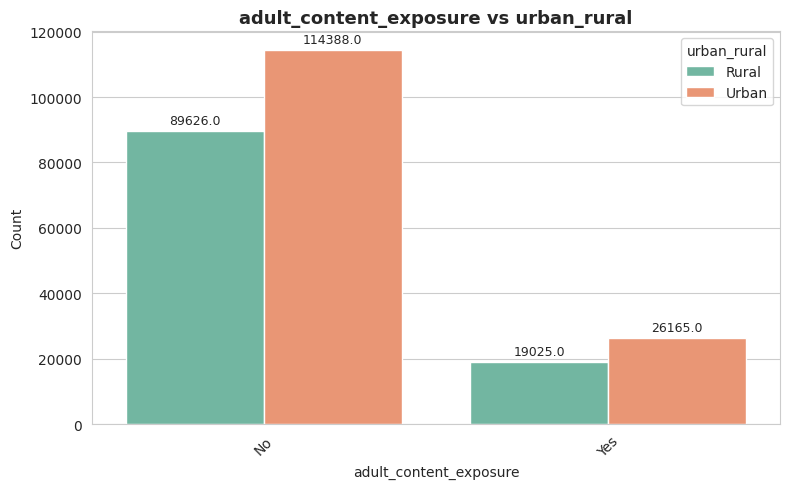

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

for col in categorical_cols:
    plt.figure(figsize=(8,5))

    ax = sns.countplot(
        x=col,
        hue='urban_rural',
        data=df,
        palette="Set2"
    )

    # Add count labels on top
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height}',  # <-- just the count
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=9,
                xytext=(0,3),
                textcoords='offset points'
            )

    plt.xticks(rotation=45)
    plt.title(f"{col} vs urban_rural", fontsize=13, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.legend(title="urban_rural")

    plt.tight_layout()
    plt.show()


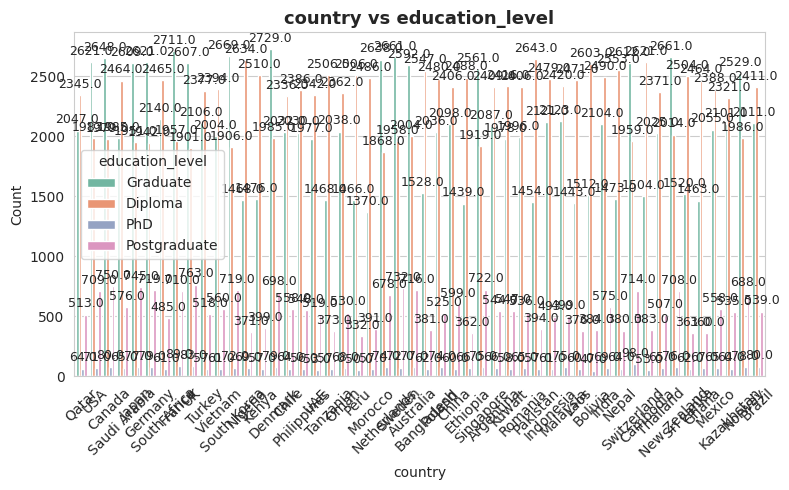

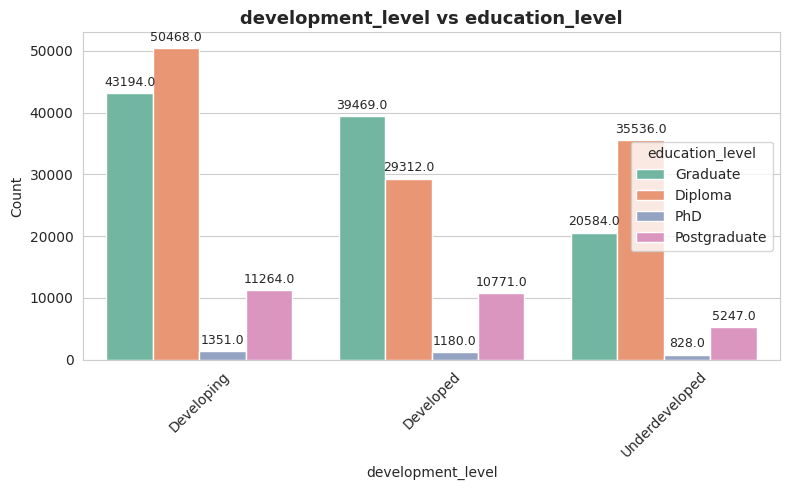

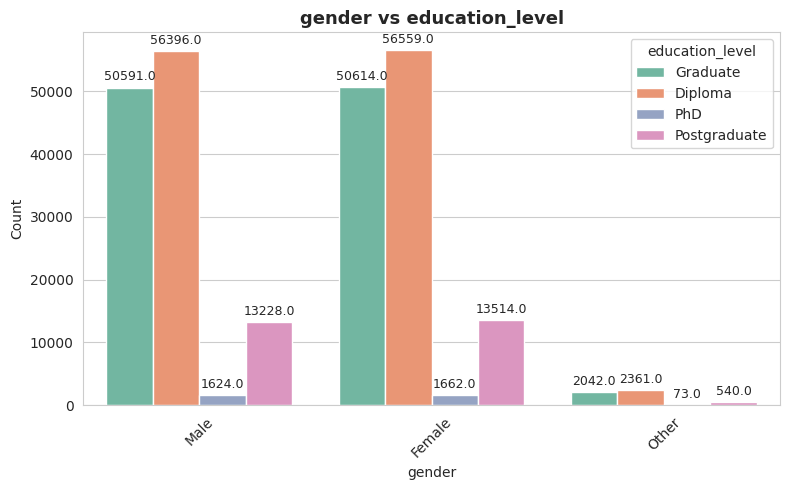

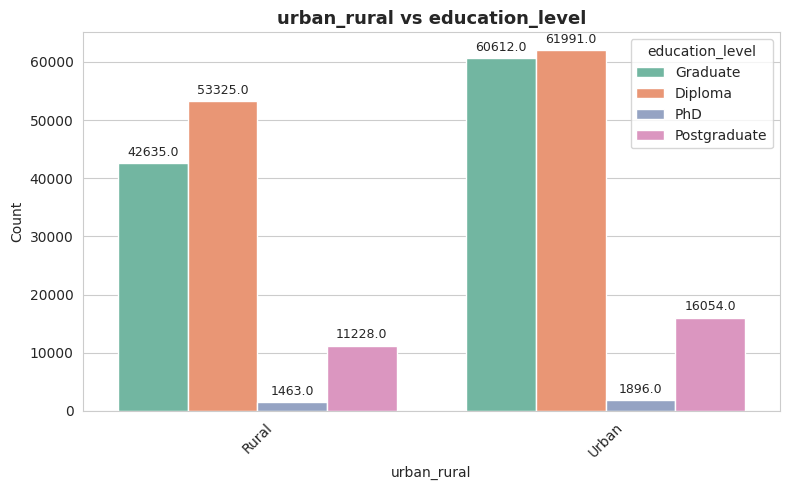

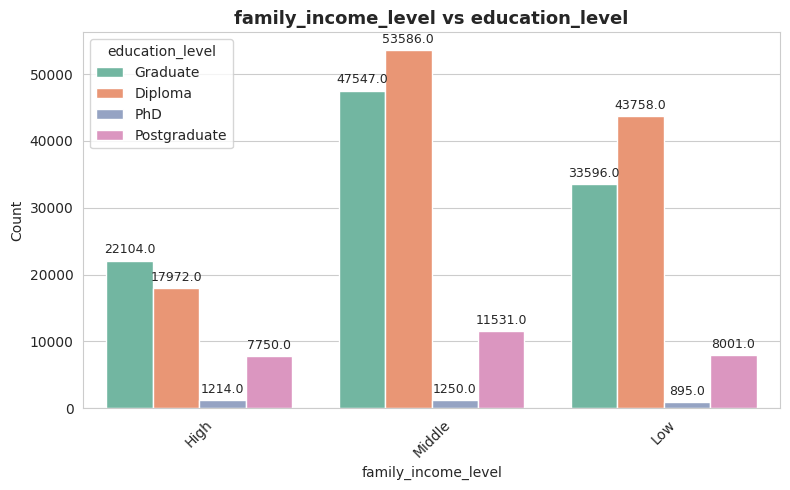

...

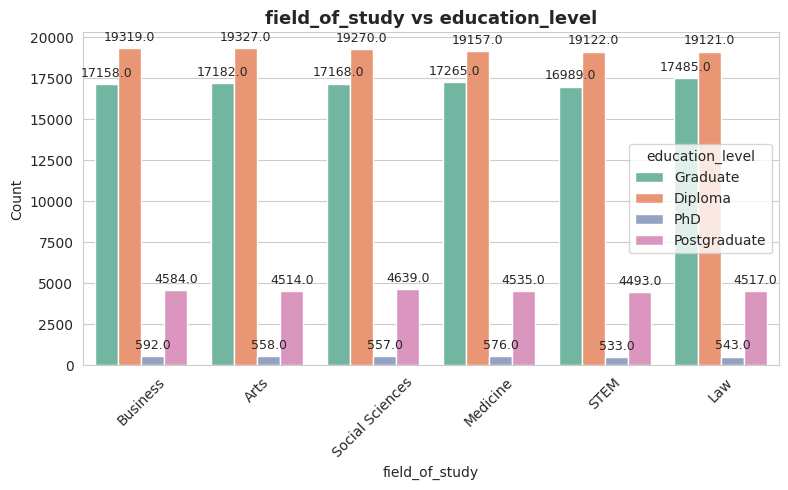

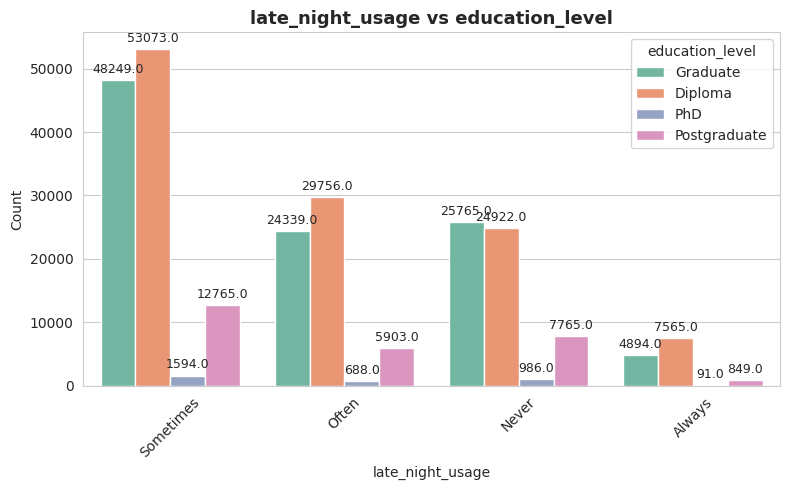

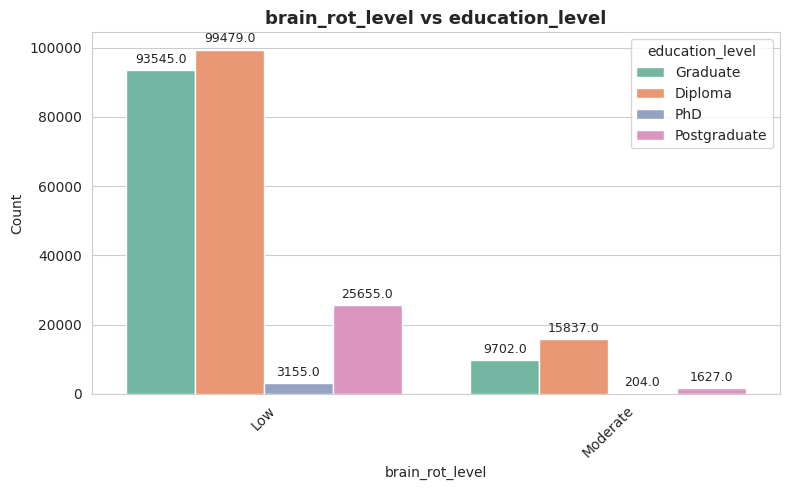

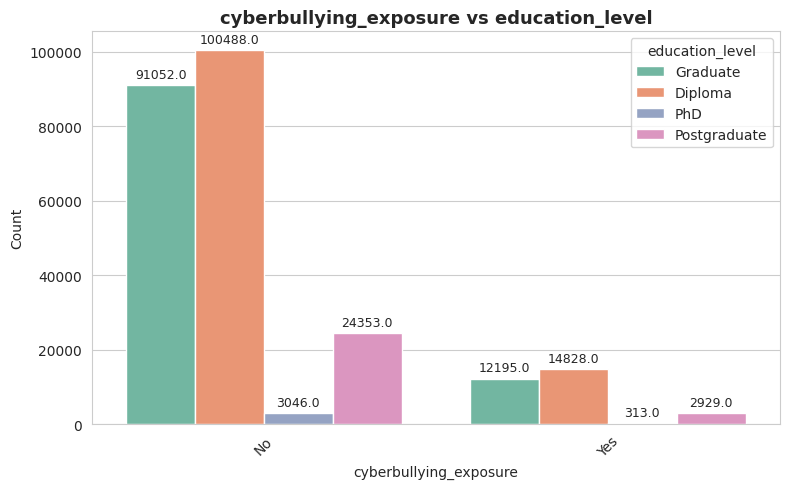

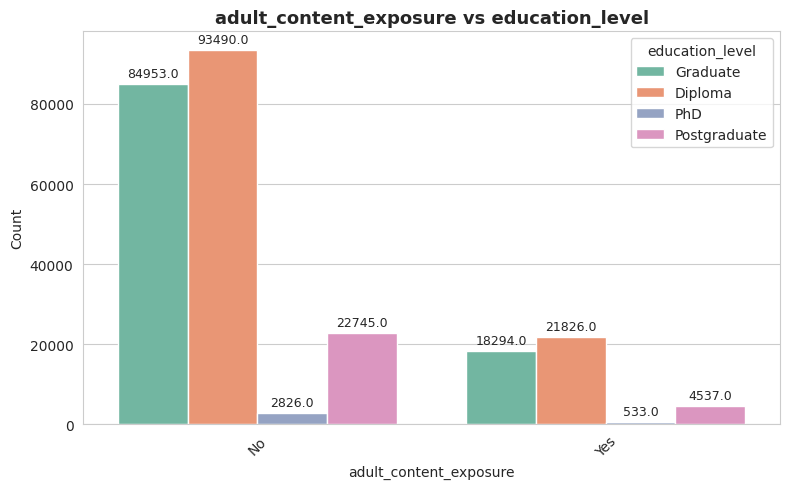

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

sns.set_style("whitegrid")

for col in categorical_cols:
    plt.figure(figsize=(8,5))

    ax = sns.countplot(
        x=col,
        hue='education_level',
        data=df,
        palette="Set2"
    )

    # Add count labels on top
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height}',  # <-- just the count
                (p.get_x() + p.get_width()/2., height),
                ha='center',
                va='bottom',
                fontsize=9,
                xytext=(0,3),
                textcoords='offset points'
            )

    plt.xticks(rotation=45)
    plt.title(f"{col} vs education_level", fontsize=13, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel("Count")
    plt.legend(title="education_level")

    plt.tight_layout()
    plt.show()


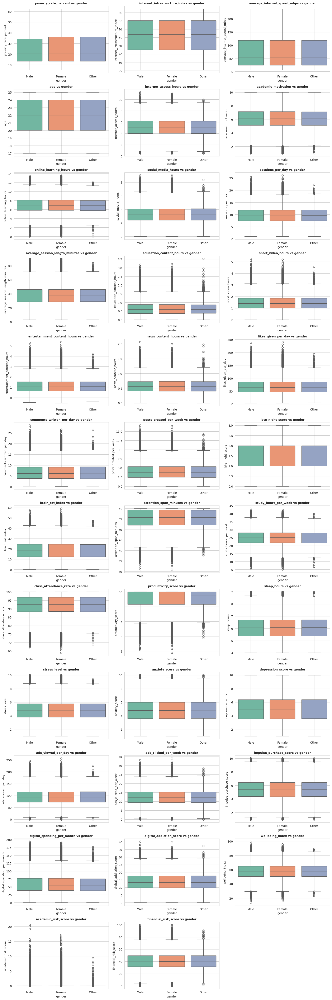

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

num_cols = len(numerical_cols)
cols = 3
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(16, rows * 4))

for i, col in enumerate(numerical_cols):
    plt.subplot(rows, cols, i + 1)

    sns.boxplot(
        x='gender',
        y=col,
        data=df,
        palette="Set2"
    )

    plt.title(f'{col} vs gender', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

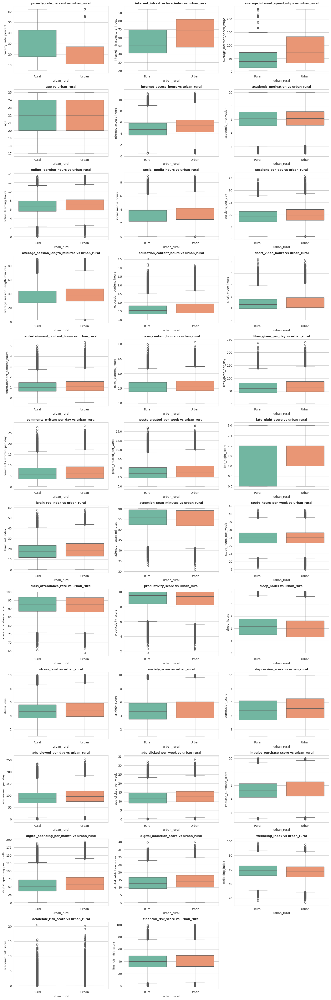

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

num_cols = len(numerical_cols)
cols = 3
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(16, rows * 4))

for i, col in enumerate(numerical_cols):
    plt.subplot(rows, cols, i + 1)

    sns.boxplot(
        x='urban_rural',
        y=col,
        data=df,
        palette="Set2"
    )

    plt.title(f'{col} vs urban_rural', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

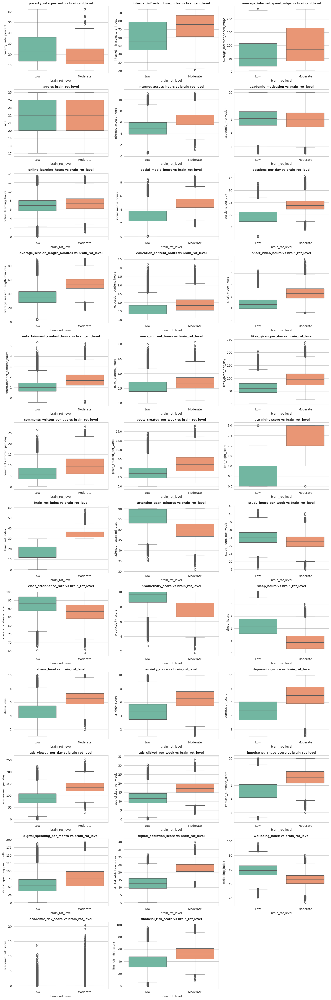

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

num_cols = len(numerical_cols)
cols = 3
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(16, rows * 4))

for i, col in enumerate(numerical_cols):
    plt.subplot(rows, cols, i + 1)

    sns.boxplot(
        x='brain_rot_level',
        y=col,
        data=df,
        palette="Set2"
    )

    plt.title(f'{col} vs brain_rot_level', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

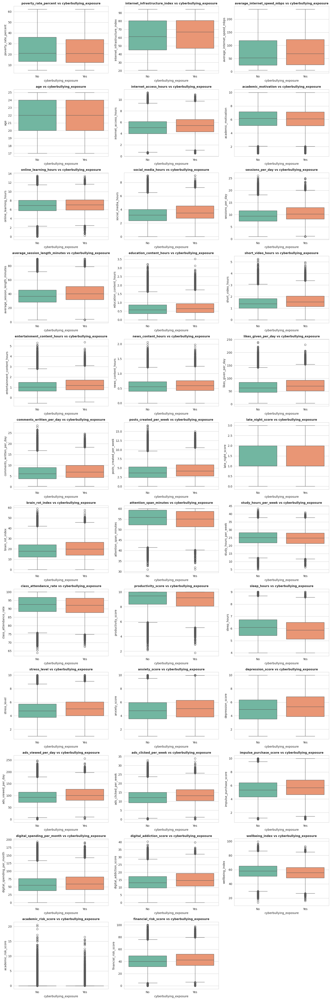

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

num_cols = len(numerical_cols)
cols = 3
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(16, rows * 4))

for i, col in enumerate(numerical_cols):
    plt.subplot(rows, cols, i + 1)

    sns.boxplot(
        x='cyberbullying_exposure',
        y=col,
        data=df,
        palette="Set2"
    )

    plt.title(f'{col} vs cyberbullying_exposure', fontsize=10, fontweight='bold')

plt.tight_layout()
plt.show()

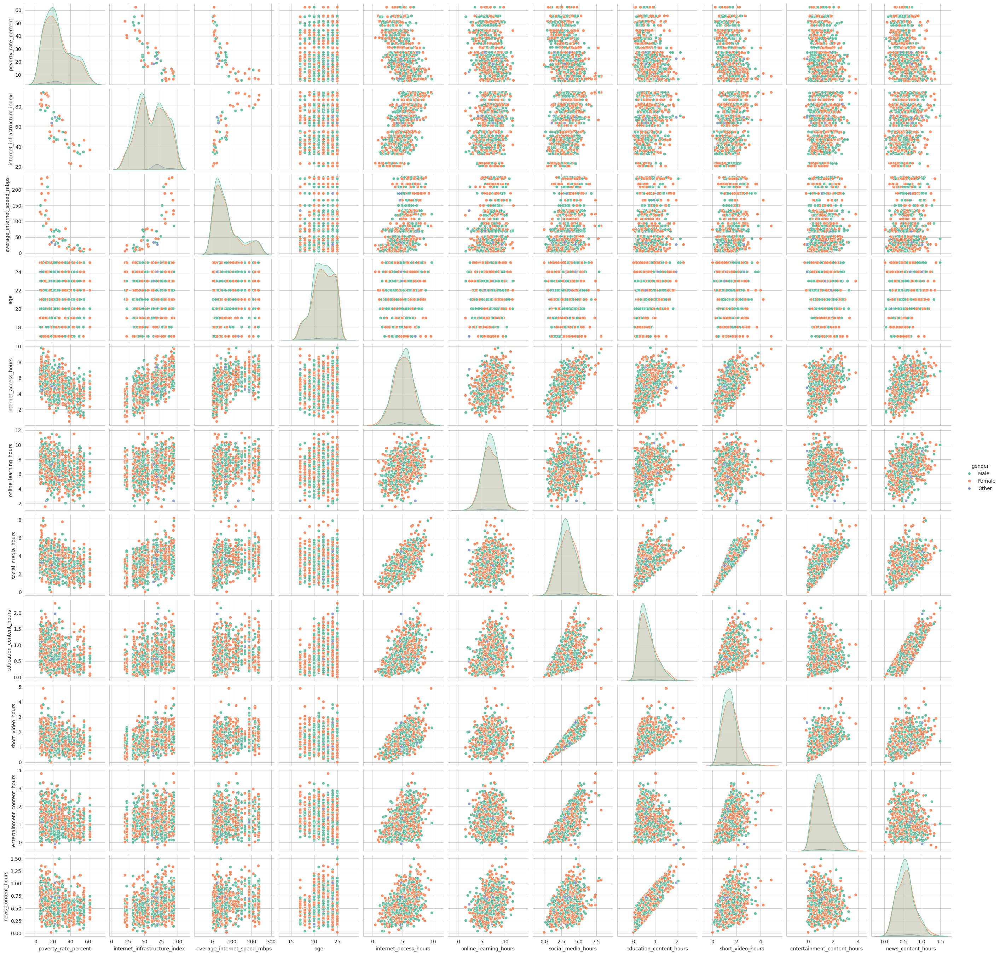

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Take random sample (much faster)
df_sample = df.sample(1000, random_state=42)

sns.pairplot(
    df_sample[['poverty_rate_percent', 'internet_infrastructure_index',
       'average_internet_speed_mbps', 'age', 'internet_access_hours',
        'online_learning_hours', 'social_media_hours',

       'education_content_hours', 'short_video_hours',
       'entertainment_content_hours', 'news_content_hours', 'gender']],
    hue='gender',
    palette="Set2"
)

plt.show()

Correlation matrix

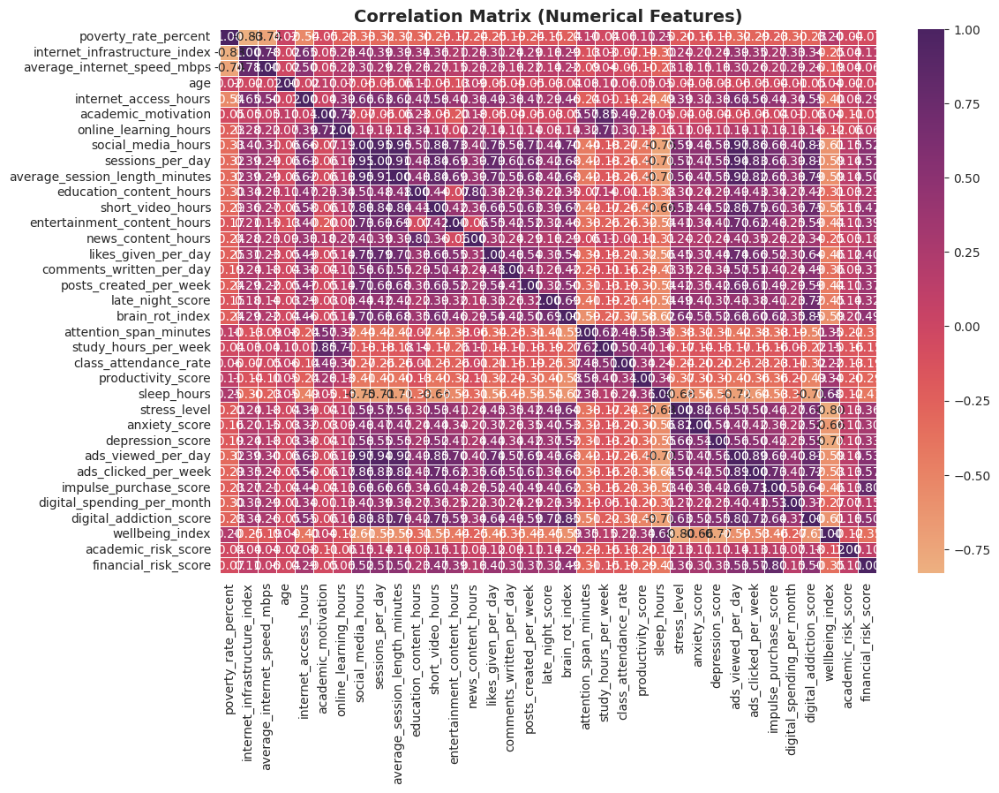

In [ ]:
plt.figure(figsize=(12, 8))

sns.heatmap(
    df[numerical_cols].corr(),
    annot=True,
    cmap='flare',
    fmt='.2f',
    linewidths=0.5
)

plt.title(
    "Correlation Matrix (Numerical Features)",
    fontsize=14,
    fontweight='bold'
)

plt.show()

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report, roc_curve, auc
)
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.multiclass import OneVsRestClassifier


# Logistic Regression
from sklearn.linear_model import LogisticRegression

# Naive Bayes
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import BernoulliNB


# SVM
from sklearn.svm import SVC
from sklearn.svm import LinearSVC



# Passive Aggressive
from sklearn.linear_model import PassiveAggressiveClassifier



# LDA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis



# Linear Regression
from sklearn.linear_model import LinearRegression

# XGBoost
from xgboost import XGBClassifier



Label encoding

In [ ]:
label_encoders = {}

for col in df.select_dtypes(include='object').columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le


In [ ]:
# checking the seasions
df['brain_rot_level'].nunique()

2

Split dataset

In [ ]:
from sklearn.model_selection import train_test_split

X = df.drop("brain_rot_level", axis=1)
y = df["brain_rot_level"]

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [ ]:
print("Training feature shape :", X_train.shape)
print("Testing feature shape  :", X_test.shape)
print("Training label shape   :", y_train.shape)
print("Testing label shape    :", y_test.shape)


Training feature shape : (199363, 46)
Testing feature shape  : (49841, 46)
Training label shape   : (199363,)
Testing label shape    : (49841,)


In [ ]:
print("Training Features (X_train):")
display(X_train.head())

print("Training Labels (y_train):")
display(y_train.head())


Training Features (X_train):


,country,development_level,poverty_rate_percent,internet_infrastructure_index,average_internet_speed_mbps,age,gender,urban_rural,family_income_level,device_access,...,ads_viewed_per_day,ads_clicked_per_week,impulse_purchase_score,digital_spending_per_month,cyberbullying_exposure,adult_content_exposure,digital_addiction_score,wellbeing_index,academic_risk_score,financial_risk_score
402914,19,1,33.98,46.91,40.26,18,0,0,1,3,...,62.770932,8.790856,5.259324,37.489953,0,0,12.811051,72.058674,0.0,43.251207
1555,24,2,36.03,42.82,14.94,24,1,0,0,3,...,70.690172,8.321929,4.193277,73.618849,0,0,12.599173,48.094378,0.0,33.692279
106943,30,2,44.14,41.89,15.38,25,0,0,2,3,...,74.404479,8.514593,5.023549,60.380635,0,0,11.303674,68.730225,0.0,30.742977
161125,47,0,12.32,93.79,133.44,18,1,1,0,0,...,169.644313,23.618281,8.563826,149.447046,0,0,21.506599,61.966707,0.0,52.979229
385546,33,1,26.85,55.75,20.42,24,0,1,2,0,...,56.846026,9.626715,5.078006,62.349774,0,0,9.834120,73.466089,0.0,41.820282


Training Labels (y_train):


,brain_rot_level
402914,0
1555,0
106943,0
161125,0
385546,0


In [ ]:
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)


Models

Logistic regression


========== Logistic Regression ==========
Train Accuracy : 0.9993479231351856
Test Accuracy  : 0.9991773840813788
Precision      : 0.9991769073945078
Recall         : 0.9991773840813788
F1 Score       : 0.9991770213860641

Classification Report

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     44367
           1       1.00      1.00      1.00      5474

    accuracy                           1.00     49841
   macro avg       1.00      1.00      1.00     49841
weighted avg       1.00      1.00      1.00     49841



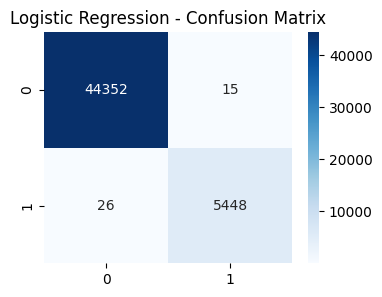

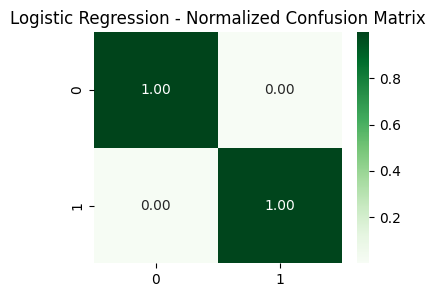

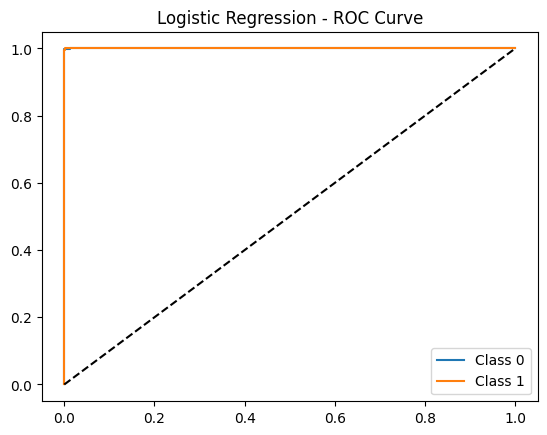

In [ ]:
comparison_results = []

def evaluate_model(model, name):
    print(f"\n========== {name} ==========")

    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred  = model.predict(X_test)

    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc  = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred, average='weighted')
    recall    = recall_score(y_test, y_test_pred, average='weighted')
    f1        = f1_score(y_test, y_test_pred, average='weighted')

    # ---- STORE RESULTS ----
    comparison_results.append([
        name, train_acc, test_acc, precision, recall, f1
    ])

    print("Train Accuracy :", train_acc)
    print("Test Accuracy  :", test_acc)
    print("Precision      :", precision)
    print("Recall         :", recall)
    print("F1 Score       :", f1)

    print("\nClassification Report\n")
    print(classification_report(y_test, y_test_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_test_pred)
    cm_norm = cm / cm.sum(axis=1, keepdims=True)

    plt.figure(figsize=(4,3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"{name} - Confusion Matrix")
    plt.show()

    plt.figure(figsize=(4,3))
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Greens')
    plt.title(f"{name} - Normalized Confusion Matrix")
    plt.show()

    # ROC Curve (Multiclass)
    ovr = OneVsRestClassifier(model)
    y_score = ovr.fit(X_train, y_train).predict_proba(X_test)

    plt.figure()
    for i in range(len(np.unique(y_train))):
        fpr, tpr, _ = roc_curve(y_test == i, y_score[:, i])
        plt.plot(fpr, tpr, label=f'Class {i}')

    plt.plot([0,1],[0,1],'k--')
    plt.legend()
    plt.title(f"{name} - ROC Curve")
    plt.show()


evaluate_model(LogisticRegression(), "Logistic Regression")

Cat Boost

In [ ]:
!pip install catboost
from catboost import CatBoostClassifier

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 8.4 MB/s eta 0:00:00



========== CatBoost ==========
Train Accuracy : 0.9995485621705131
Test Accuracy  : 0.9994582773218836
Precision      : 0.9994586067923596
Recall         : 0.9994582773218836
F1 Score       : 0.999457690063779

Classification Report

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     44367
           1       1.00      1.00      1.00      5474

    accuracy                           1.00     49841
   macro avg       1.00      1.00      1.00     49841
weighted avg       1.00      1.00      1.00     49841



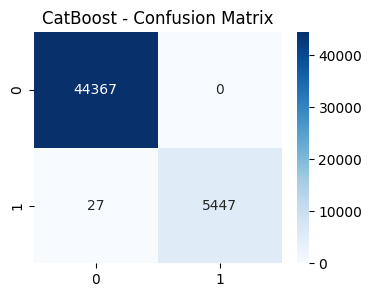

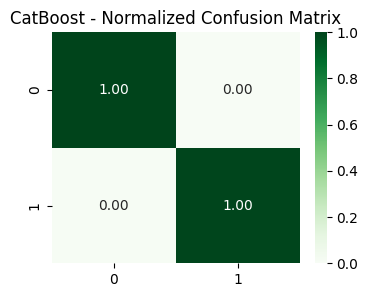

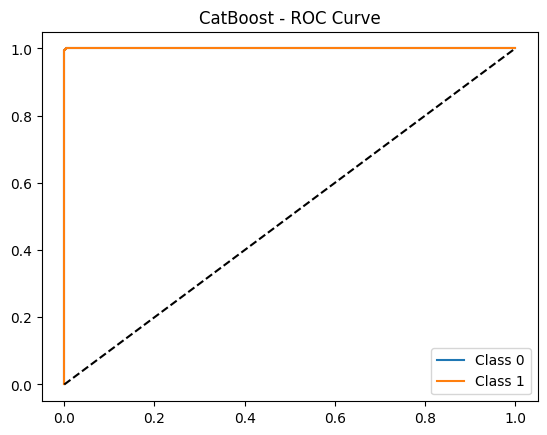

In [ ]:

def evaluate_model(model, name):
    print(f"\n========== {name} ==========")

    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred  = model.predict(X_test)

    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc  = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred, average='weighted')
    recall    = recall_score(y_test, y_test_pred, average='weighted')
    f1        = f1_score(y_test, y_test_pred, average='weighted')

    # ---- STORE RESULTS ----
    comparison_results.append([
        name, train_acc, test_acc, precision, recall, f1
    ])

    print("Train Accuracy :", train_acc)
    print("Test Accuracy  :", test_acc)
    print("Precision      :", precision)
    print("Recall         :", recall)
    print("F1 Score       :", f1)

    print("\nClassification Report\n")
    print(classification_report(y_test, y_test_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_test_pred)
    cm_norm = cm / cm.sum(axis=1, keepdims=True)

    plt.figure(figsize=(4,3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"{name} - Confusion Matrix")
    plt.show()

    plt.figure(figsize=(4,3))
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Greens')
    plt.title(f"{name} - Normalized Confusion Matrix")
    plt.show()

    # ROC Curve (Multiclass)
    ovr = OneVsRestClassifier(model)
    y_score = ovr.fit(X_train, y_train).predict_proba(X_test)

    plt.figure()
    for i in range(len(np.unique(y_train))):
        fpr, tpr, _ = roc_curve(y_test == i, y_score[:, i])
        plt.plot(fpr, tpr, label=f'Class {i}')

    plt.plot([0,1],[0,1],'k--')
    plt.legend()
    plt.title(f"{name} - ROC Curve")
    plt.show()


evaluate_model(
    CatBoostClassifier(
        iterations=200,
        depth=6,
        learning_rate=0.05,
        loss_function='MultiClass',
        verbose=0,
        random_state=42
    ),
    "CatBoost"
)

Naive Bayes


========== Naive Bayes ==========
Train Accuracy : 0.8913338984666161
Test Accuracy  : 0.8904717000060192
Precision      : 0.9338634572485986
Recall         : 0.8904717000060192
F1 Score       : 0.9033978131772915

Classification Report

              precision    recall  f1-score   support

           0       0.99      0.89      0.94     44367
           1       0.50      0.91      0.65      5474

    accuracy                           0.89     49841
   macro avg       0.74      0.90      0.79     49841
weighted avg       0.93      0.89      0.90     49841



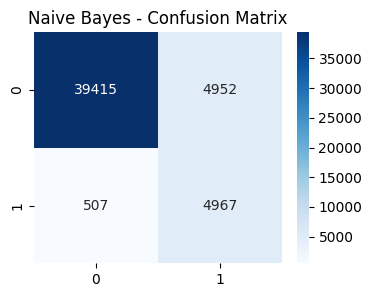

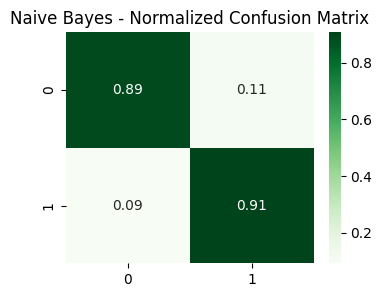

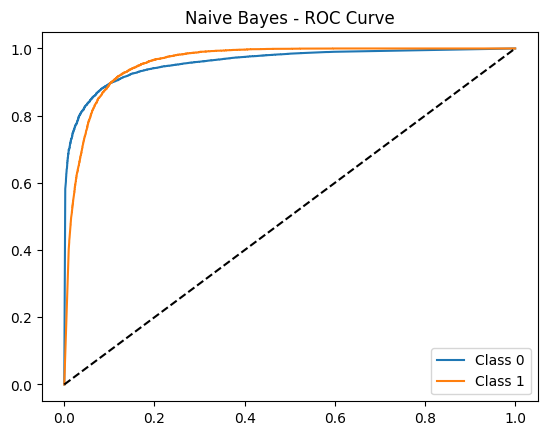

In [ ]:
def evaluate_model(model, name):
    print(f"\n========== {name} ==========")

    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred  = model.predict(X_test)

    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc  = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred, average='weighted')
    recall    = recall_score(y_test, y_test_pred, average='weighted')
    f1        = f1_score(y_test, y_test_pred, average='weighted')

    # ---- STORE RESULTS ----
    comparison_results.append([
        name, train_acc, test_acc, precision, recall, f1
    ])

    print("Train Accuracy :", train_acc)
    print("Test Accuracy  :", test_acc)
    print("Precision      :", precision)
    print("Recall         :", recall)
    print("F1 Score       :", f1)

    print("\nClassification Report\n")
    print(classification_report(y_test, y_test_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_test_pred)
    cm_norm = cm / cm.sum(axis=1, keepdims=True)

    plt.figure(figsize=(4,3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"{name} - Confusion Matrix")
    plt.show()

    plt.figure(figsize=(4,3))
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Greens')
    plt.title(f"{name} - Normalized Confusion Matrix")
    plt.show()

    # ROC Curve (Multiclass)
    ovr = OneVsRestClassifier(model)
    y_score = ovr.fit(X_train, y_train).predict_proba(X_test)

    plt.figure()
    for i in range(len(np.unique(y_train))):
        fpr, tpr, _ = roc_curve(y_test == i, y_score[:, i])
        plt.plot(fpr, tpr, label=f'Class {i}')

    plt.plot([0,1],[0,1],'k--')
    plt.legend()
    plt.title(f"{name} - ROC Curve")
    plt.show()
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
evaluate_model(GaussianNB(

),
               "Naive Bayes")


XG Boost


========== XG Boost ==========
Train Accuracy : 1.0
Test Accuracy  : 0.9994382135189904
Precision      : 0.9994382192333178
Recall         : 0.9994382135189904
F1 Score       : 0.9994377175527887

Classification Report

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     44367
           1       1.00      1.00      1.00      5474

    accuracy                           1.00     49841
   macro avg       1.00      1.00      1.00     49841
weighted avg       1.00      1.00      1.00     49841



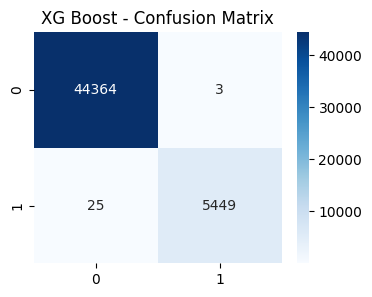

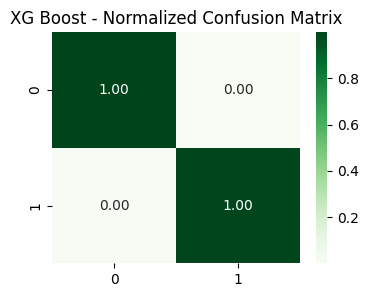

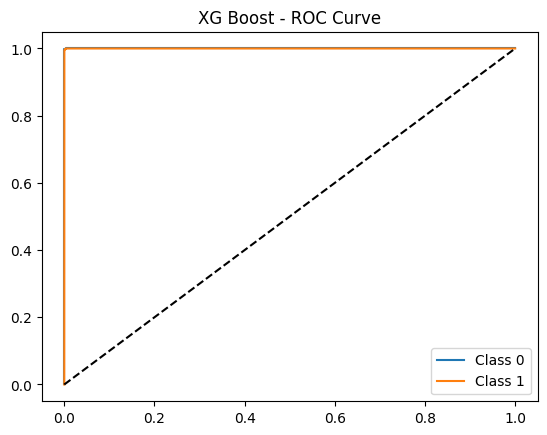

In [ ]:

def evaluate_model(model, name):
    print(f"\n========== {name} ==========")

    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred  = model.predict(X_test)

    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc  = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred, average='weighted')
    recall    = recall_score(y_test, y_test_pred, average='weighted')
    f1        = f1_score(y_test, y_test_pred, average='weighted')

    # ---- STORE RESULTS ----
    comparison_results.append([
        name, train_acc, test_acc, precision, recall, f1
    ])

    print("Train Accuracy :", train_acc)
    print("Test Accuracy  :", test_acc)
    print("Precision      :", precision)
    print("Recall         :", recall)
    print("F1 Score       :", f1)

    print("\nClassification Report\n")
    print(classification_report(y_test, y_test_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_test_pred)
    cm_norm = cm / cm.sum(axis=1, keepdims=True)

    plt.figure(figsize=(4,3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"{name} - Confusion Matrix")
    plt.show()

    plt.figure(figsize=(4,3))
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Greens')
    plt.title(f"{name} - Normalized Confusion Matrix")
    plt.show()

    # ROC Curve (Multiclass)
    ovr = OneVsRestClassifier(model)
    y_score = ovr.fit(X_train, y_train).predict_proba(X_test)

    plt.figure()
    for i in range(len(np.unique(y_train))):
        fpr, tpr, _ = roc_curve(y_test == i, y_score[:, i])
        plt.plot(fpr, tpr, label=f'Class {i}')

    plt.plot([0,1],[0,1],'k--')
    plt.legend()
    plt.title(f"{name} - ROC Curve")
    plt.show()




from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

evaluate_model(
    XGBClassifier(),
    "XG Boost"
)

Linear Discriminant Analysis


========== Linear Discriminant Analysis ==========
Train Accuracy : 0.9574394446311502
Test Accuracy  : 0.9575048654722016
Precision      : 0.9560585714076223
Recall         : 0.9575048654722016
F1 Score       : 0.9564926964324167

Classification Report

              precision    recall  f1-score   support

           0       0.97      0.98      0.98     44367
           1       0.84      0.76      0.80      5474

    accuracy                           0.96     49841
   macro avg       0.91      0.87      0.89     49841
weighted avg       0.96      0.96      0.96     49841



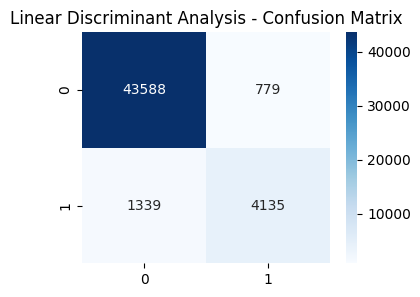

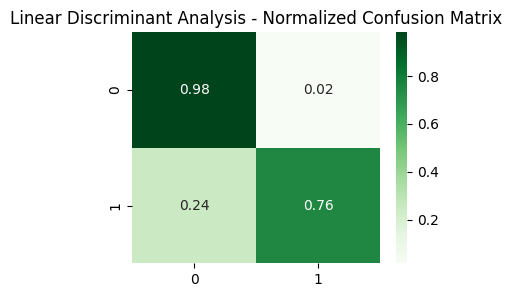

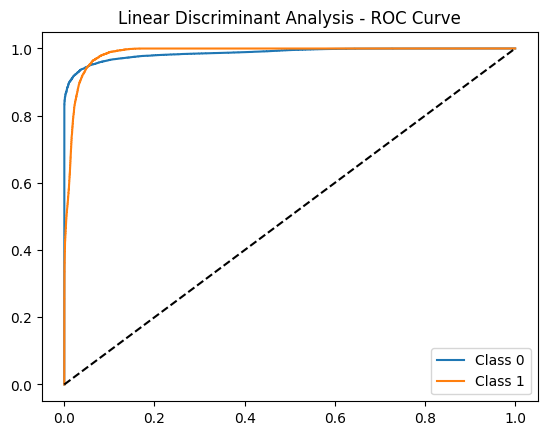

In [ ]:

def evaluate_model(model, name):
    print(f"\n========== {name} ==========")

    model.fit(X_train, y_train)

    y_train_pred = model.predict(X_train)
    y_test_pred  = model.predict(X_test)

    train_acc = accuracy_score(y_train, y_train_pred)
    test_acc  = accuracy_score(y_test, y_test_pred)
    precision = precision_score(y_test, y_test_pred, average='weighted')
    recall    = recall_score(y_test, y_test_pred, average='weighted')
    f1        = f1_score(y_test, y_test_pred, average='weighted')

    # ---- STORE RESULTS ----
    comparison_results.append([
        name, train_acc, test_acc, precision, recall, f1
    ])

    print("Train Accuracy :", train_acc)
    print("Test Accuracy  :", test_acc)
    print("Precision      :", precision)
    print("Recall         :", recall)
    print("F1 Score       :", f1)

    print("\nClassification Report\n")
    print(classification_report(y_test, y_test_pred))

    # Confusion Matrix
    cm = confusion_matrix(y_test, y_test_pred)
    cm_norm = cm / cm.sum(axis=1, keepdims=True)

    plt.figure(figsize=(4,3))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.title(f"{name} - Confusion Matrix")
    plt.show()

    plt.figure(figsize=(4,3))
    sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Greens')
    plt.title(f"{name} - Normalized Confusion Matrix")
    plt.show()

    # ROC Curve (Multiclass)
    ovr = OneVsRestClassifier(model)
    y_score = ovr.fit(X_train, y_train).predict_proba(X_test)

    plt.figure()
    for i in range(len(np.unique(y_train))):
        fpr, tpr, _ = roc_curve(y_test == i, y_score[:, i])
        plt.plot(fpr, tpr, label=f'Class {i}')

    plt.plot([0,1],[0,1],'k--')
    plt.legend()
    plt.title(f"{name} - ROC Curve")
    plt.show()


evaluate_model(
    LinearDiscriminantAnalysis(),
    "Linear Discriminant Analysis")


Model comparison

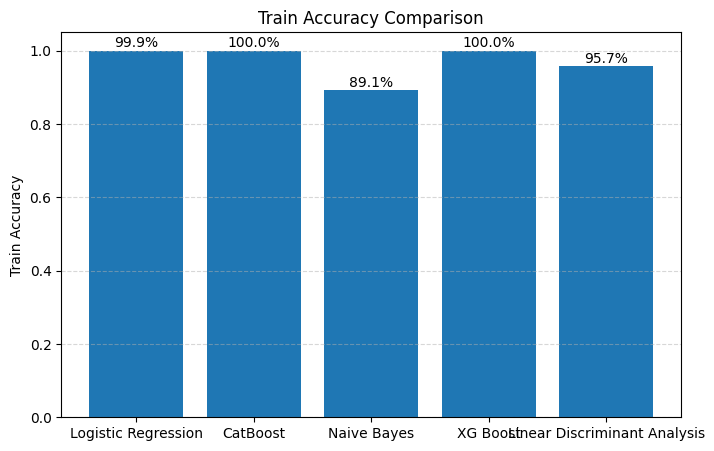

In [ ]:
results = np.array(comparison_results, dtype=object)

models     = results[:, 0]
train_acc  = results[:, 1].astype(float)


def plot_metric(values, title, ylabel):
    plt.figure(figsize=(8,5))
    bars = plt.bar(models, values)

    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h + 0.01,
            f"{h*100:.1f}%",
            ha='center',
            fontsize=10
        )

    plt.ylim(0,1.05)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()
plot_metric(train_acc, "Train Accuracy Comparison", "Train Accuracy")



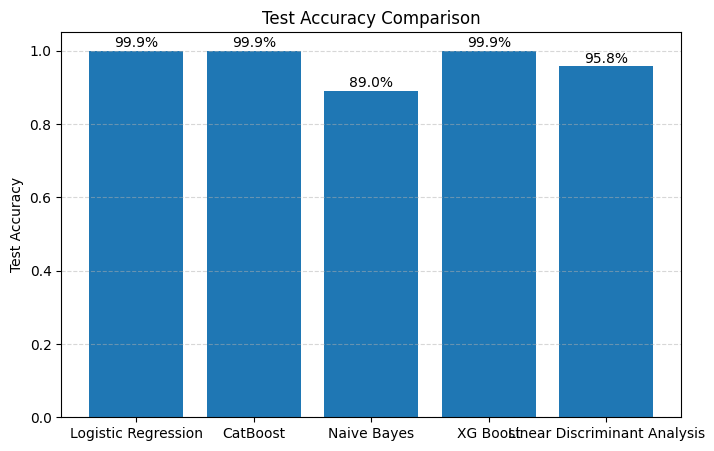

In [ ]:
results = np.array(comparison_results, dtype=object)

models     = results[:, 0]
test_acc   = results[:, 2].astype(float)


def plot_metric(values, title, ylabel):
    plt.figure(figsize=(8,5))
    bars = plt.bar(models, values)

    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h + 0.01,
            f"{h*100:.1f}%",
            ha='center',
            fontsize=10
        )

    plt.ylim(0,1.05)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()

plot_metric(test_acc,  "Test Accuracy Comparison",  "Test Accuracy")


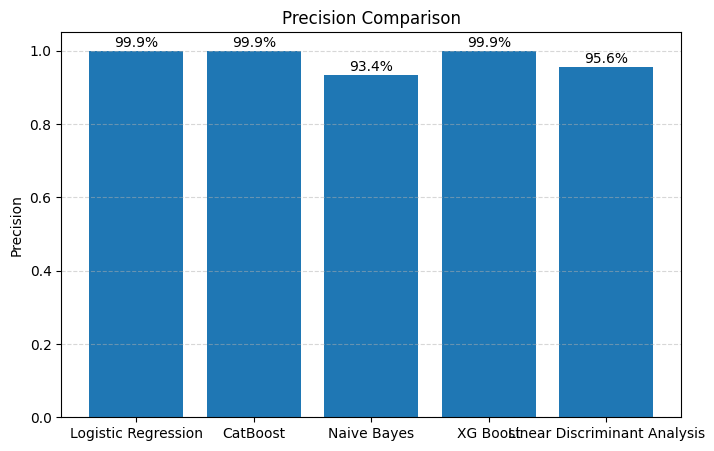

In [ ]:
results = np.array(comparison_results, dtype=object)

models     = results[:, 0]

precision  = results[:, 3].astype(float)


def plot_metric(values, title, ylabel):
    plt.figure(figsize=(8,5))
    bars = plt.bar(models, values)

    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h + 0.01,
            f"{h*100:.1f}%",
            ha='center',
            fontsize=10
        )

    plt.ylim(0,1.05)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()

plot_metric(precision, "Precision Comparison",      "Precision")



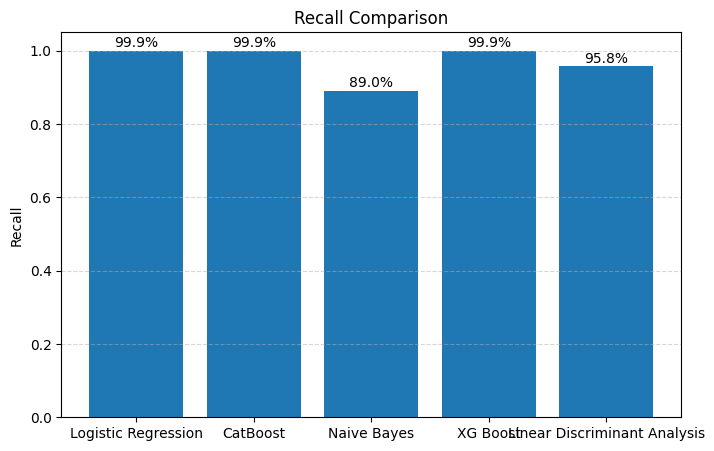

In [ ]:
results = np.array(comparison_results, dtype=object)

models     = results[:, 0]

recall     = results[:, 4].astype(float)


def plot_metric(values, title, ylabel):
    plt.figure(figsize=(8,5))
    bars = plt.bar(models, values)

    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h + 0.01,
            f"{h*100:.1f}%",
            ha='center',
            fontsize=10
        )

    plt.ylim(0,1.05)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()

plot_metric(recall,    "Recall Comparison",         "Recall")



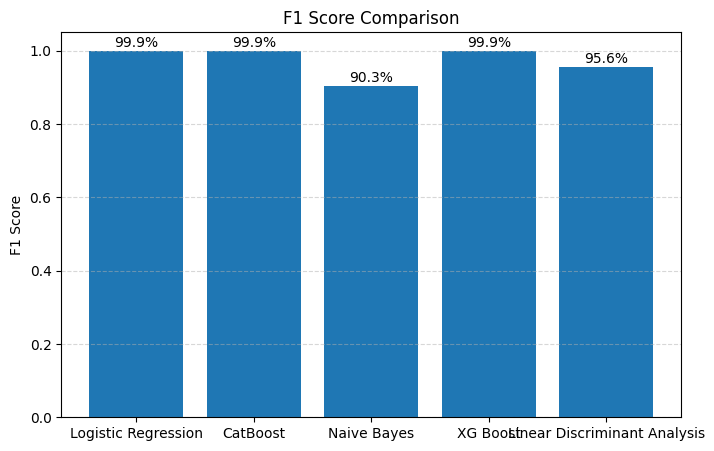

In [ ]:
results = np.array(comparison_results, dtype=object)

models     = results[:, 0]
f1_score_v = results[:, 5].astype(float)

def plot_metric(values, title, ylabel):
    plt.figure(figsize=(8,5))
    bars = plt.bar(models, values)

    for bar in bars:
        h = bar.get_height()
        plt.text(
            bar.get_x() + bar.get_width()/2,
            h + 0.01,
            f"{h*100:.1f}%",
            ha='center',
            fontsize=10
        )

    plt.ylim(0,1.05)
    plt.ylabel(ylabel)
    plt.title(title)
    plt.grid(axis='y', linestyle='--', alpha=0.5)
    plt.show()

plot_metric(f1_score_v,"F1 Score Comparison",       "F1 Score")


prediction mental health

In [ ]:
# ============================================================
# SOCIAL MEDIA & MENTAL WELL-BEING CLASSIFICATION SYSTEM
# ============================================================

# ============================================================
# IMPORT LIBRARIES
# ============================================================

import pandas as pd
import numpy as np

from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import (
    accuracy_score,
    classification_report,
    confusion_matrix
)

import joblib

# ============================================================
# LOAD DATASET
# ============================================================

df = pd.read_csv("/content/drive/MyDrive/Social media affect/global_student_digital_behavior_dataset.csv")


# ============================================================
# SELECT IMPORTANT INPUT FEATURES
# ============================================================

selected_features = [

    'age',
    'gender',

    'social_media_hours',
    'sessions_per_day',
    'average_session_length_minutes',

    'late_night_usage',

    'short_video_hours',

    'sleep_hours',

    'study_hours_per_week',

    'digital_addiction_score'

]


# ============================================================
# CREATE TARGET VARIABLE
# Mental Well-being Level
# ============================================================

def create_risk_category(row):

    # ====================================================
    # NORMALIZED WEIGHTED RISK SCORE
    # ====================================================

    risk_score = (

        row['stress_level'] * 0.30 +

        row['anxiety_score'] * 0.30 +

        row['depression_score'] * 0.25 +

        row['digital_addiction_score'] * 0.10 +

        row['social_media_hours'] * 0.05

        -

        row['wellbeing_index'] * 0.08
    )

    # ====================================================
    # RISK LEVEL THRESHOLDS
    # ====================================================

    if risk_score < 4.5:
        return "Low Risk"

    elif risk_score < 7.5:
        return "Moderate Risk"

    else:
        return "High Risk"


# ============================================================
# APPLY TARGET CREATION
# ============================================================

df['Mental_Wellbeing_Level'] = df.apply(
    create_risk_category,
    axis=1
)


# ============================================================
# KEEP ONLY REQUIRED COLUMNS
# ============================================================

df = df[selected_features + ['Mental_Wellbeing_Level']]

# ============================================================
# ENCODE CATEGORICAL COLUMNS
# ============================================================

label_encoders = {}

categorical_columns = df.select_dtypes(include='object').columns

for col in categorical_columns:

    le = LabelEncoder()

    df[col] = le.fit_transform(df[col].astype(str))

    label_encoders[col] = le

# ============================================================
# FEATURES & TARGET
# ============================================================

X = df[selected_features]

y = df['Mental_Wellbeing_Level']

# ============================================================
# TRAIN TEST SPLIT
# ============================================================

X_train, X_test, y_train, y_test = train_test_split(

    X,
    y,

    test_size=0.2,

    random_state=42,

    stratify=y
)

# ============================================================
# FEATURE SCALING
# ============================================================

scaler = StandardScaler()

X_train = scaler.fit_transform(X_train)

X_test = scaler.transform(X_test)

# ============================================================
# BUILD RANDOM FOREST MODEL
# ============================================================

model = RandomForestClassifier(

    n_estimators=200,

    max_depth=10,

    random_state=42

)


model.fit(X_train, y_train)

# ============================================================
# PREDICTION
# ============================================================

# ============================================================
# FEATURE IMPORTANCE
# ============================================================

importance_df = pd.DataFrame({

    'Feature': selected_features,

    'Importance': model.feature_importances_

})

importance_df = importance_df.sort_values(
    by='Importance',
    ascending=False
)



In [ ]:
# ============================================================
# USER INPUT SYSTEM
# ============================================================

print("\n========================================")
print("ENTER USER DETAILS")
print("========================================")

# ============================================================
# TAKE USER INPUT
# ============================================================

age = int(input("Enter Age: "))

gender = input("Enter Gender (Male/Female): ")

social_media_hours = float(input(
    "Enter Social Media Hours Per Day: "
))

sessions_per_day = int(input(
    "Enter Sessions Per Day: "
))

average_session_length_minutes = float(input(
    "Enter Average Session Length (Minutes): "
))

late_night_usage = input(
    "Late Night Usage (Never/Sometimes/Often): "
)

short_video_hours = float(input(
    "Enter Short Video Hours: "
))

sleep_hours = float(input(
    "Enter Sleep Hours Per Day: "
))

study_hours_per_week = float(input(
    "Enter Study Hours Per Week: "
))

digital_addiction_score = float(input(
    "Enter Digital Addiction Score: "
))

# ============================================================
# CREATE USER DATAFRAME
# ============================================================

new_user = pd.DataFrame([{

    'age': age,

    'gender': gender,

    'social_media_hours': social_media_hours,

    'sessions_per_day': sessions_per_day,

    'average_session_length_minutes':
        average_session_length_minutes,

    'late_night_usage': late_night_usage,

    'short_video_hours': short_video_hours,

    'sleep_hours': sleep_hours,

    'study_hours_per_week': study_hours_per_week,

    'digital_addiction_score': digital_addiction_score

}])

# ============================================================
# ENCODE USER CATEGORICAL INPUTS
# ============================================================

new_user['gender'] = label_encoders[
    'gender'
].transform(new_user['gender'])

new_user['late_night_usage'] = label_encoders[
    'late_night_usage'
].transform(new_user['late_night_usage'])

# ============================================================
# SCALE INPUT
# ============================================================

new_user_scaled = scaler.transform(new_user)

# ============================================================
# PREDICT
# ============================================================

prediction = model.predict(new_user_scaled)

# ============================================================
# DECODE PREDICTION
# ============================================================

risk_label = label_encoders[
    'Mental_Wellbeing_Level'
].inverse_transform(prediction)

# ============================================================
# FINAL OUTPUT
# ============================================================

print("\n========================================")
print("PREDICTED MENTAL WELL-BEING LEVEL")
print("========================================")

print("Mental Well-being Level:", risk_label[0])

# ============================================================
# END
# ============================================================


ENTER USER DETAILS
Enter Age: 25
Enter Gender (Male/Female): Male
Enter Social Media Hours Per Day: 13
Enter Sessions Per Day: 35
Enter Average Session Length (Minutes): 80
Late Night Usage (Never/Sometimes/Often): Often
Enter Short Video Hours: 8
Enter Sleep Hours Per Day: 4
Enter Study Hours Per Week: 40
Enter Digital Addiction Score: 40

PREDICTED MENTAL WELL-BEING LEVEL
Mental Well-being Level: High Risk


Expalinable AI

In [ ]:
best_model = XGBClassifier(
    eval_metric='logloss',
    random_state=42
)
best_model.fit(
    X_train,
    y_train
)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=True, eval_metric='logloss',
              feature_types=None, feature_weights=None, gamma=None,
              grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=None, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=None, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=None, n_jobs=None,
              num_parallel_tree=None, ...)

In [ ]:
!pip install shap -q

In [ ]:
import shap
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
feature_names = X.columns.tolist()

In [ ]:
explainer = shap.TreeExplainer(
    best_model
)

In [ ]:
shap_values = explainer.shap_values(
    X_test
)

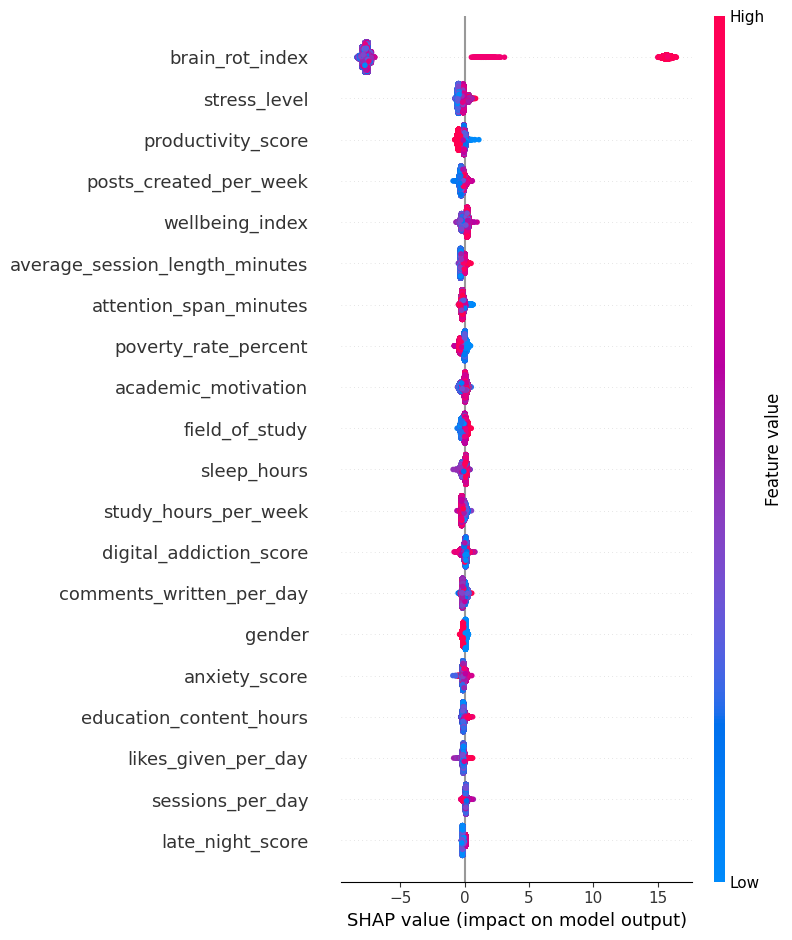

In [ ]:
shap.summary_plot(
    shap_values,
    X_test,
    feature_names=feature_names
)

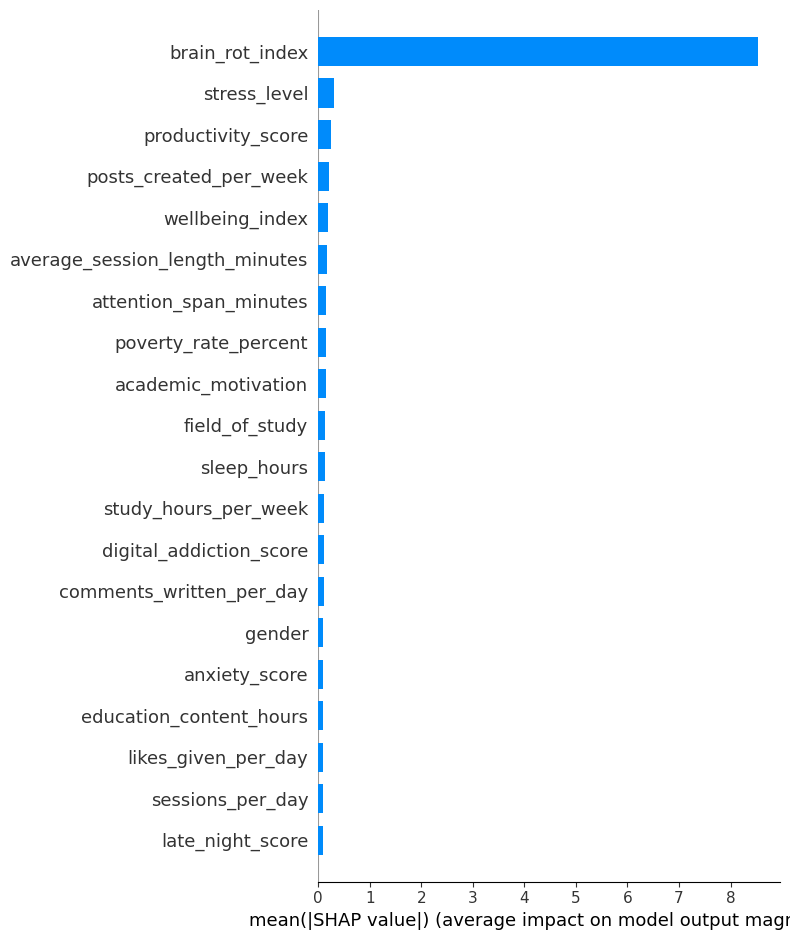

In [ ]:
shap.summary_plot(
    shap_values,
    X_test,
    feature_names=feature_names,
    plot_type="bar"
)

In [ ]:
importance = np.abs(
    shap_values
).mean(axis=0)

importance_df = pd.DataFrame({
    "Feature": feature_names,
    "Importance": importance
})

importance_df = importance_df.sort_values(
    by="Importance",
    ascending=False
)

print(
    importance_df.head(10)
)

                           Feature  Importance
27                 brain_rot_index    8.531703
33                    stress_level    0.304277
31              productivity_score    0.246900
25          posts_created_per_week    0.202560
43                 wellbeing_index    0.194328
17  average_session_length_minutes    0.174214
28          attention_span_minutes    0.155368
2             poverty_rate_percent    0.155071
13             academic_motivation    0.144315
12                  field_of_study    0.140322


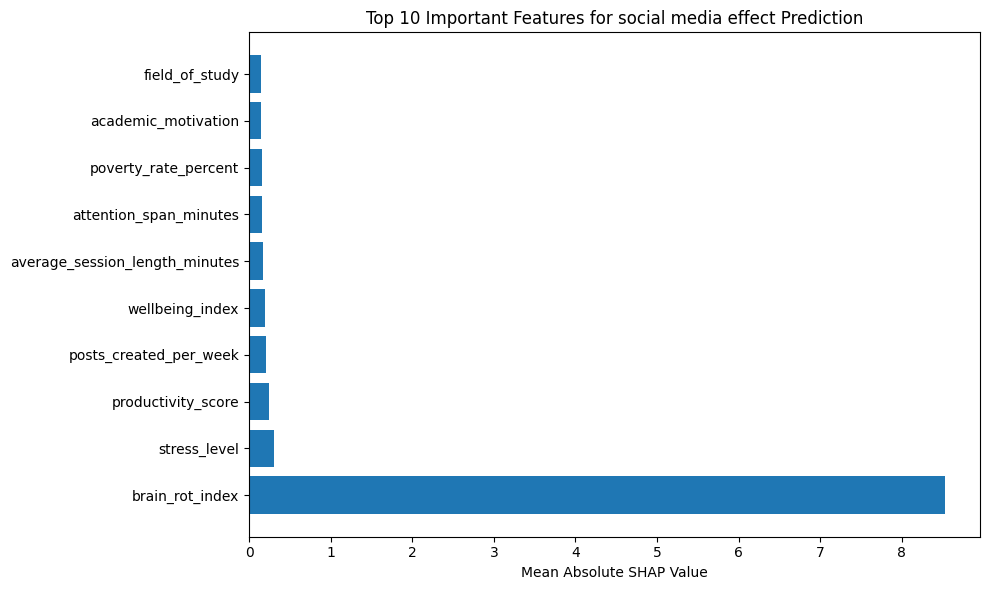

In [ ]:
top10 = importance_df.head(10)

plt.figure(figsize=(10,6))

plt.barh(
    top10["Feature"],
    top10["Importance"]
)

plt.title(
    "Top 10 Important Features for social media effect Prediction"
)

plt.xlabel(
    "Mean Absolute SHAP Value"
)

plt.tight_layout()
plt.show()

SHAP Waterfall

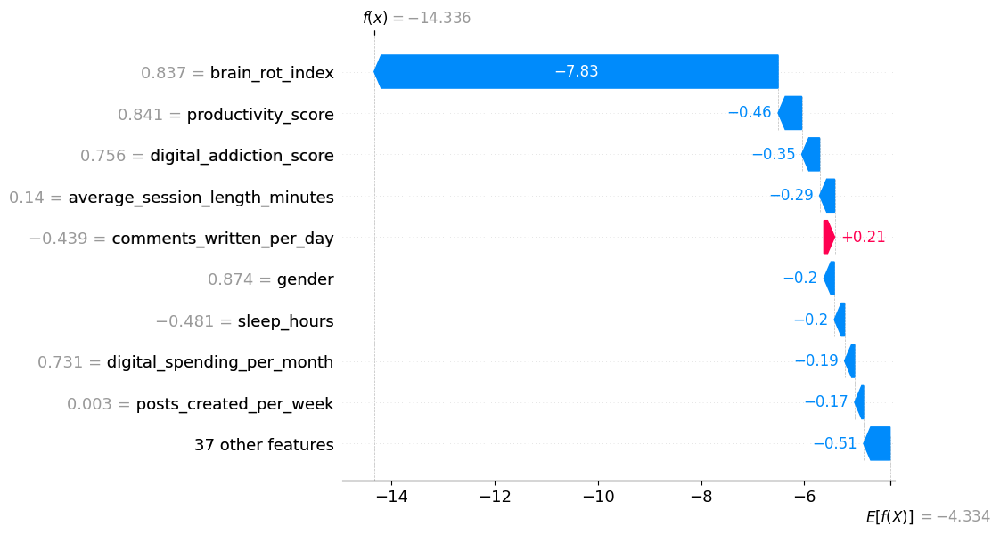

In [ ]:
id = 0
shap.plots.waterfall(
    shap.Explanation(
        values=shap_values[id],
        base_values=explainer.expected_value,
        data=X_test[id],
        feature_names=feature_names
    )
)

In [ ]:
shap.initjs()

shap.force_plot(
    explainer.expected_value,
    shap_values[0],
    X_test[0],
    feature_names=feature_names
)

END